# Wine Type and Quality Classification    


Dataset acquired from UCI Machine Learning Repository(https://archive.ics.uci.edu/ml/datasets/wine+quality)

###### Input variables (based on physicochemical tests):
- fixed acidity
- volatile acidity
- citric acid
- residual sugar
- chlorides
- free sulfur dioxide
- total sulfur dioxide
- density
- pH
- sulphates
- alcohol

##### Output variable (based on sensory data):
- type(red or white)
- quality (score between 0 and 10)



### Import Packages

In [ ]:
pip install --ignore-installed --upgrade matplotlib

In [ ]:
pip install --ignore-installed --upgrade tensorflow

In [ ]:
!pip install skater

In [ ]:
import os
import numpy as np
import pandas as pd
import pylab 
import seaborn as sns
sns.set(style="ticks", color_codes=True, font_scale=1.5)
from matplotlib import pyplot as plt
from matplotlib.ticker import FormatStrFormatter
from matplotlib.colors import ListedColormap
%matplotlib inline
import mpl_toolkits
from mpl_toolkits.mplot3d import Axes3D
from graphviz import Source
from IPython.display import Image

from scipy.stats import skew, norm, probplot, boxcox, f_oneway
from scipy import interp
from sklearn.base import BaseEstimator, TransformerMixin, clone, ClassifierMixin
from sklearn import metrics, tree
from sklearn.preprocessing import LabelEncoder, label_binarize, StandardScaler, PolynomialFeatures, MinMaxScaler

from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.model_selection import GridSearchCV, cross_val_score, KFold, cross_val_predict, train_test_split
from sklearn.metrics import roc_auc_score, roc_curve, auc, accuracy_score

from sklearn.linear_model import LogisticRegression
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.tree import DecisionTreeClassifier
import xgboost as xgb
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, ExtraTreesClassifier
from sklearn.ensemble.gradient_boosting import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from mlxtend.classifier import StackingClassifier

from skater.core.local_interpretation.lime.lime_tabular import LimeTabularExplainer
from skater.core.explanations import Interpretation
from skater.model import InMemoryModel

import warnings
warnings.simplefilter(action = 'ignore', category=FutureWarning)
warnings.filterwarnings('ignore')
def ignore_warn(*args, **kwargs):
    pass

warnings.warn = ignore_warn 


### Load Dataset
Quality label based on the quality score according to:
- Low for less or equal to 5
- Medium between 6 and 7
- High for more then 7

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
wines = pd.read_csv('/content/drive/My Drive/dataset/winequalityN.csv')

wines['quality_label'] = wines.quality.apply(lambda q: 'low' if q <= 5 else 'medium' if q <= 7 else 'high')
#wines.quality_label = pd.Categorical(wines.quality_label, categories=['low', 'medium', 'high'], ordered=True)

# re-shuffle records just to randomize data points
wines = wines.sample(frac=1, random_state=101).reset_index(drop=True)

## Exploratory Data Analysis (EDA)


### Nulls Check and Cleaning

In [ ]:
wines.quality_label.value_counts()

medium    3915
low       2384
high       198
Name: quality_label, dtype: int64

In [ ]:
wines.dropna().quality_label.value_counts()

medium    3894
low       2372
high       197
Name: quality_label, dtype: int64

We lose 1 record of high, 12 of low and 21 of medium, out of a total of 34 (0,5%) being safe deletes them. 

In [ ]:
#null values treatment
wines.dropna(inplace=True)

class DataFrameImputer(TransformerMixin):

    def __init__(self):
        """
        Impute missing values:
        - Columns of dtype object are imputed with the most frequent value in column.
        - Columns of other types are imputed with mean of column.
        
        """
    def fit(self, X, y=None):

        self.fill = pd.Series([X[c].value_counts().index[0]
            if X[c].dtype == np.dtype('O') else X[c].mean() for c in X],
            index=X.columns)

        return self

    def transform(self, X, y=None):
        return X.fillna(self.fill)

wines = DataFrameImputer().fit_transform(wines)

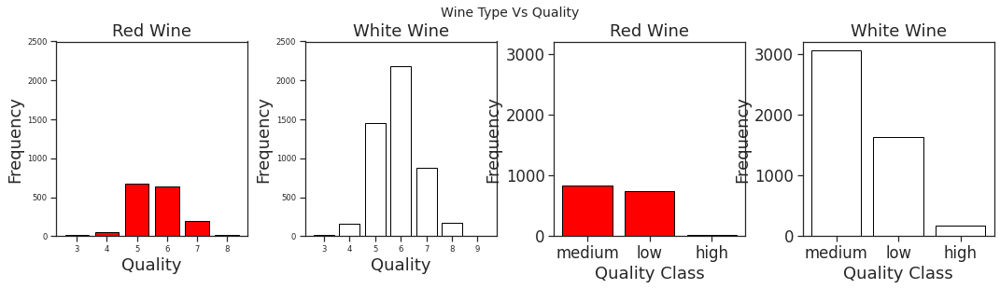

In [ ]:
#Checking Class imbalance
fig = plt.figure(figsize = (18, 4))
title = fig.suptitle("Wine Type Vs Quality", fontsize=14)
fig.subplots_adjust(top=0.85, wspace=0.3)

ax1 = fig.add_subplot(1,4, 1)
ax1.set_title("Red Wine")
ax1.set_xlabel("Quality")
ax1.set_ylabel("Frequency") 
rw_q = wines.quality[wines.type == 'red'].value_counts()
rw_q = (list(rw_q.index), list(rw_q.values))
ax1.set_ylim([0, 2500])
ax1.tick_params(axis='both', which='major', labelsize=8.5)
bar1 = ax1.bar(rw_q[0], rw_q[1], color='red', edgecolor='black', linewidth=1)


ax2 = fig.add_subplot(1,4, 2)
ax2.set_title("White Wine")
ax2.set_xlabel("Quality")
ax2.set_ylabel("Frequency") 
ww_q = wines.quality[wines.type == 'white'].value_counts()
ww_q = (list(ww_q.index), list(ww_q.values))
ax2.set_ylim([0, 2500])
ax2.tick_params(axis='both', which='major', labelsize=8.5)
bar2 = ax2.bar(ww_q[0], ww_q[1], color='white', edgecolor='black', linewidth=1)

ax3 = fig.add_subplot(1,4, 3)
ax3.set_title("Red Wine")
ax3.set_xlabel("Quality Class")
ax3.set_ylabel("Frequency") 
rw_q = wines.quality_label[wines.type == 'red'].value_counts()
rw_q = (list(rw_q.index), list(rw_q.values))
ax3.set_ylim([0, 3200])
bar3 = ax3.bar(list(range(len(rw_q[0]))), rw_q[1], color='red', edgecolor='black', linewidth=1, tick_label =rw_q[0])

ax4 = fig.add_subplot(1,4, 4)
ax4.set_title("White Wine")
ax4.set_xlabel("Quality Class")
ax4.set_ylabel("Frequency") 
ww_q = wines.quality_label[wines.type == 'white'].value_counts()
ww_q = (list(ww_q.index), list(ww_q.values))
ax4.set_ylim([0, 3200])
bar4 = ax4.bar(list(range(len(ww_q[0]))), ww_q[1], color='white', edgecolor='black', linewidth=1, tick_label =ww_q[0])

### Descriptive Statistics
#### By Type

In [ ]:
subset_attributes = wines.columns
rs = round(wines.loc[wines.type == 'red', subset_attributes].describe(),2)
ws = round(wines.loc[wines.type == 'white', subset_attributes].describe(),2)
pd.concat([rs, ws], axis=0, keys=['Red Wine Statistics', 'White Wine Statistics']).T

Red Wine Statistics                ... White Wine Statistics                
                                   count   mean    std  ...                   50%     75%     max
fixed acidity                     1593.0   8.33   1.74  ...                  6.80    7.30   14.20
volatile acidity                  1593.0   0.53   0.18  ...                  0.26    0.32    1.10
citric acid                       1593.0   0.27   0.19  ...                  0.32    0.39    1.66
residual sugar                    1593.0   2.54   1.41  ...                  5.20    9.90   65.80
chlorides                         1593.0   0.09   0.05  ...                  0.04    0.05    0.35
free sulfur dioxide               1593.0  15.84  10.44  ...                 34.00   46.00  289.00
total sulfur dioxide              1593.0  46.46  32.91  ...                134.00  167.00  440.00
density                           1593.0   1.00   0.00  ...                  0.99    1.00    1.04
pH                                1593.0   3.31   0.15  ...                  3.18    3.28    3.82
sulphates                         1593.0   0.66   0.17  ...                  0.47    0.55    1.08
alcohol                           1593.0  10.42   1.07  ...                 10.40   11.40   14.20
quality                           1593.0   5.64   0.81  ...                  6.00    6.00    9.00

[12 rows x 16 columns]


- Mean residual sugar and total sulfur dioxide content in white wine seems to be much higher than red wine.
- Mean value of sulphates, fixed acidity and volatile acidity seem to be higher in red wine as compared to white wine.
- From all numbers, we observe that citric acid is more present in white than red wines.
- In general, white wines has half concentrations of chlorides then red wines.
- Although in Ph the difference seems small it is interesting to note that it is slightly larger in green red wines.



#### By Quality


In [ ]:
#subset_attributes = ['alcohol', 'volatile acidity', 'pH', 'quality']
ls = round(wines[wines['quality_label'] == 'low'][subset_attributes].describe(),2)
ms = round(wines[wines['quality_label'] == 'medium'][subset_attributes].describe(),2)
hs = round(wines[wines['quality_label'] == 'high'][subset_attributes].describe(),2)
pd.concat([ls, ms, hs], axis=0, keys=['Low Quality Wine', 'Medium Quality Wine', 'High Quality Wine']).T

Low Quality Wine                 ... High Quality Wine                
                                count    mean    std  ...               50%     75%     max
fixed acidity                  2372.0    7.33   1.27  ...              6.80    7.30   12.60
volatile acidity               2372.0    0.40   0.19  ...              0.27    0.35    0.85
citric acid                    2372.0    0.30   0.16  ...              0.32    0.36    0.74
residual sugar                 2372.0    5.63   4.91  ...              4.10    7.60   14.80
chlorides                      2372.0    0.06   0.04  ...              0.04    0.04    0.12
free sulfur dioxide            2372.0   29.48  19.86  ...             34.00   43.00  105.00
total sulfur dioxide           2372.0  119.21  61.90  ...            119.00  145.00  212.50
density                        2372.0    1.00   0.00  ...              0.99    0.99    1.00
pH                             2372.0    3.21   0.16  ...              3.23    3.33    3.72
sulphates                      2372.0    0.52   0.14  ...              0.48    0.60    1.10
alcohol                        2372.0    9.87   0.84  ...             12.00   12.60   14.00
quality                        2372.0    4.88   0.36  ...              8.00    8.00    9.00

[12 rows x 24 columns]


- It is interesting how alcohol does not give us much variation to distinguish whether the vine is white or red, but it makes a lot of difference in quality. Note that the higher the quality the higher the average alcohol concentration, increased by about 1% at each level. Although lower quality wines have the lowest standard deviation.
- The chlorides and volatile acidity are less present and presented smaller standard deviation in wines of higher quality.
- The free sulfur dioxide is higher with higher quality, but their standard deviation decrease with the increase the quality.
- Higher quality has less fixed acidity, but the standard deviation is slightly higher in mean quality



### Check for any correlations between features


In [ ]:
# re-shuffle records just to randomize data points
wines = wines.sample(frac=1, random_state=101).reset_index(drop=True)

class_tp = LabelEncoder()
y_tp = class_tp.fit_transform(wines.type.values) # 1 - White; 0 - Red
wines['color'] = y_tp

class_ql = {'low':0, 'medium': 1, 'high': 2}
y_ql = wines.quality_label.map(class_ql)

#### Check for correlations based on wines types


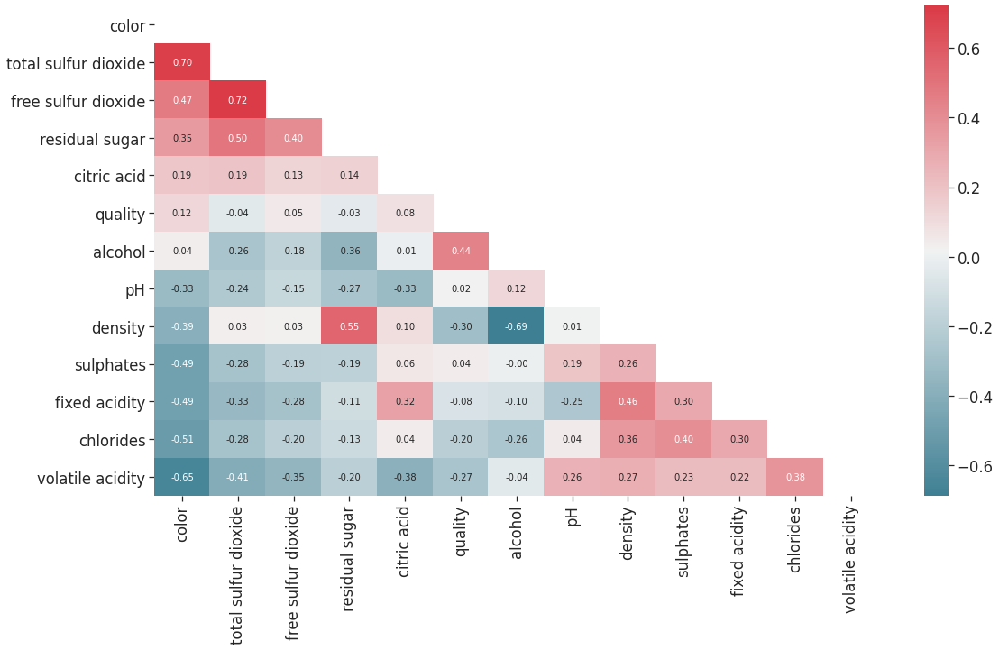

In [ ]:
corr = wines.corr()
top_corr_cols = corr.color.sort_values(ascending=False).keys()
top_corr = corr.loc[top_corr_cols, top_corr_cols]
dropSelf = np.zeros_like(top_corr)
dropSelf[np.triu_indices_from(dropSelf)] = True
plt.figure(figsize=(18, 10))
sns.heatmap(top_corr, cmap=sns.diverging_palette(220, 10, as_cmap=True), annot=True, fmt=".2f", mask=dropSelf)
sns.set(font_scale=1.5)
plt.show()
del corr, dropSelf, top_corr

While most of the correlations are weak, we can see that:
- Total and free sulfur dioxide has the higest correlation with white wines and each other. In fact, the second is a parcel of the fisrt and it is represent a colinearity that can be a problamem for linear classifiers, special if the target will predict the color, in that case we need drop the  free sulfur dioxide.
- The residual sugar has a half relation to the total sulfur dioxide and 0.40 with free, it is a god indication that wich more residual sugar more sulfur dioxide is added by the winemaker. The 0.5 indicates that white wine tend to have more residual sugar then red wine.
- Densite has a relatively high positive correlation to residual sugar and relatively high negative correlation to alcohol.
- The chlorides and volatile acidity has -0.51 and -0,65 correlations between color, indicate a tendency to red wines classification.

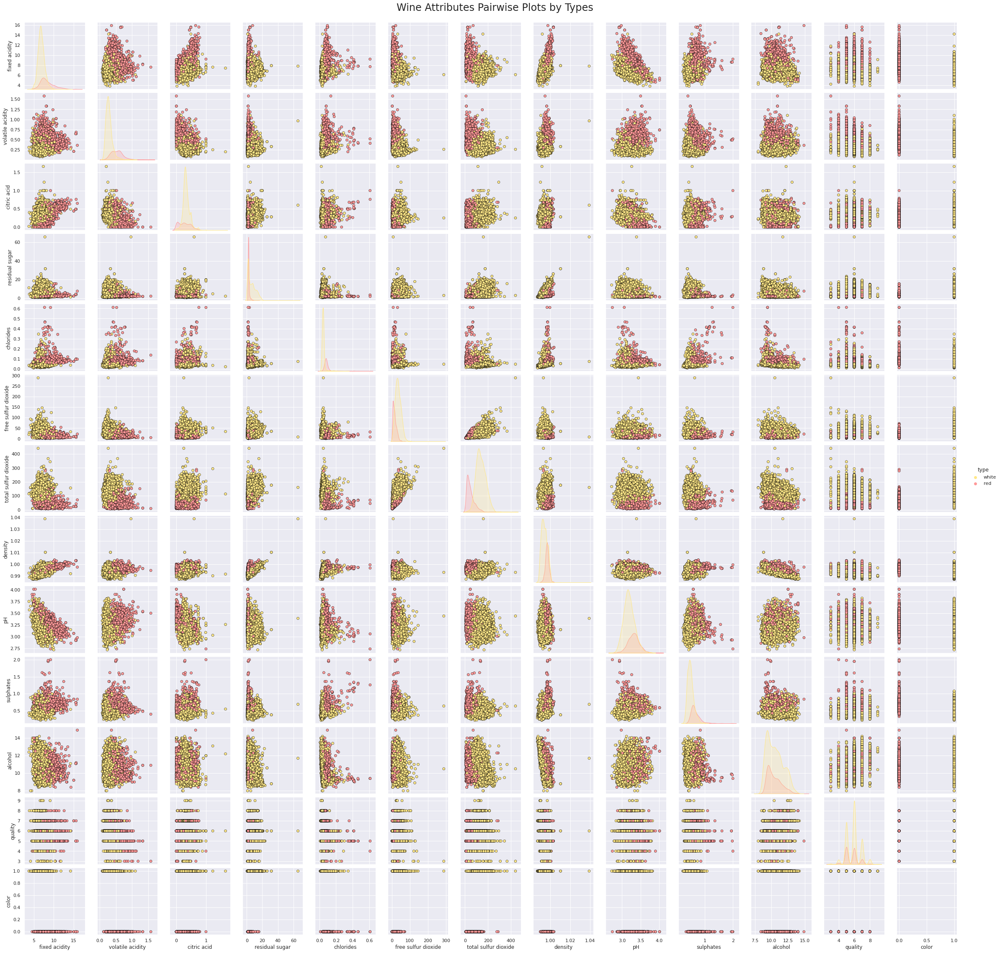

In [ ]:
sns.set(font_scale=1.0)
g = sns.pairplot(data = wines, hue='type', palette={'red': '#FF9999', 'white': '#FFE888'},plot_kws=dict(edgecolor='black', linewidth=0.5))
fig = g.fig 
fig.subplots_adjust(top=0.96, wspace=0.2)
t = fig.suptitle('Wine Attributes Pairwise Plots by Types', fontsize=24)

From pair plot above we can notice several interesting patterns, which are in alignment with the insights we obtained earlier at ANOVA test and correlations
- Residual sugar, total sulfur dioxide and citric acid in white wine seems to be much higher than red wine.
- Sulphates, fixed acidity and volatile acidity seem to be higher in red wine as compared to white wine.
- Density has slightly strong negative correlation with  alcohol, which is confirmed by the linear trend of the points from left to right in a decreasing (downward) direction.
- Density has slightly strong positive correlation with residual sugar, which is reinforced by two white wine outliers.

Let's see the correlation and pair plots from the perpective of quality:

#### Check for correlations based on wines quality labels


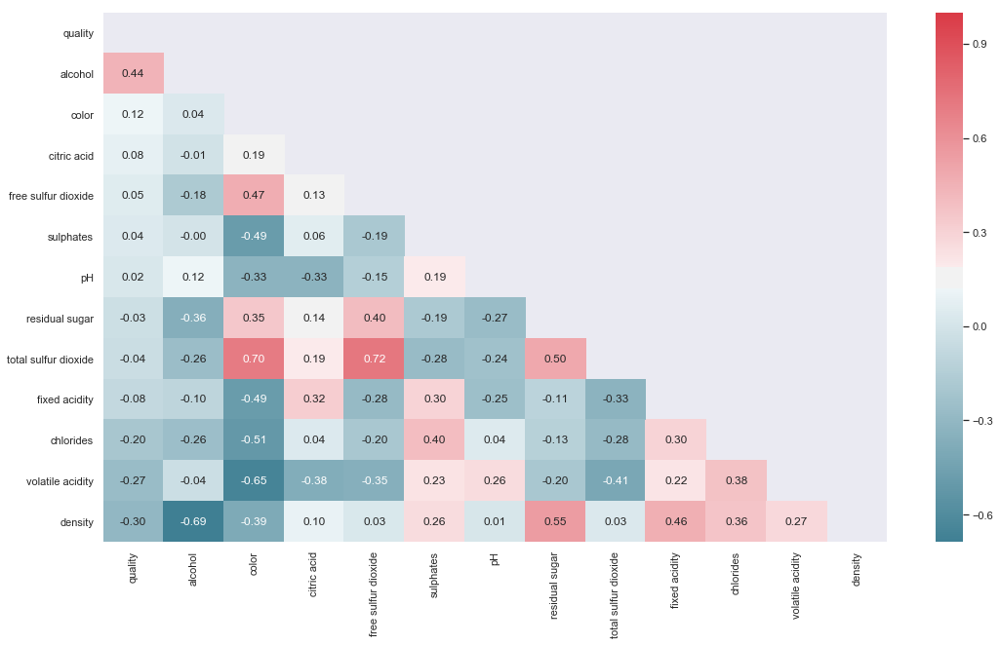

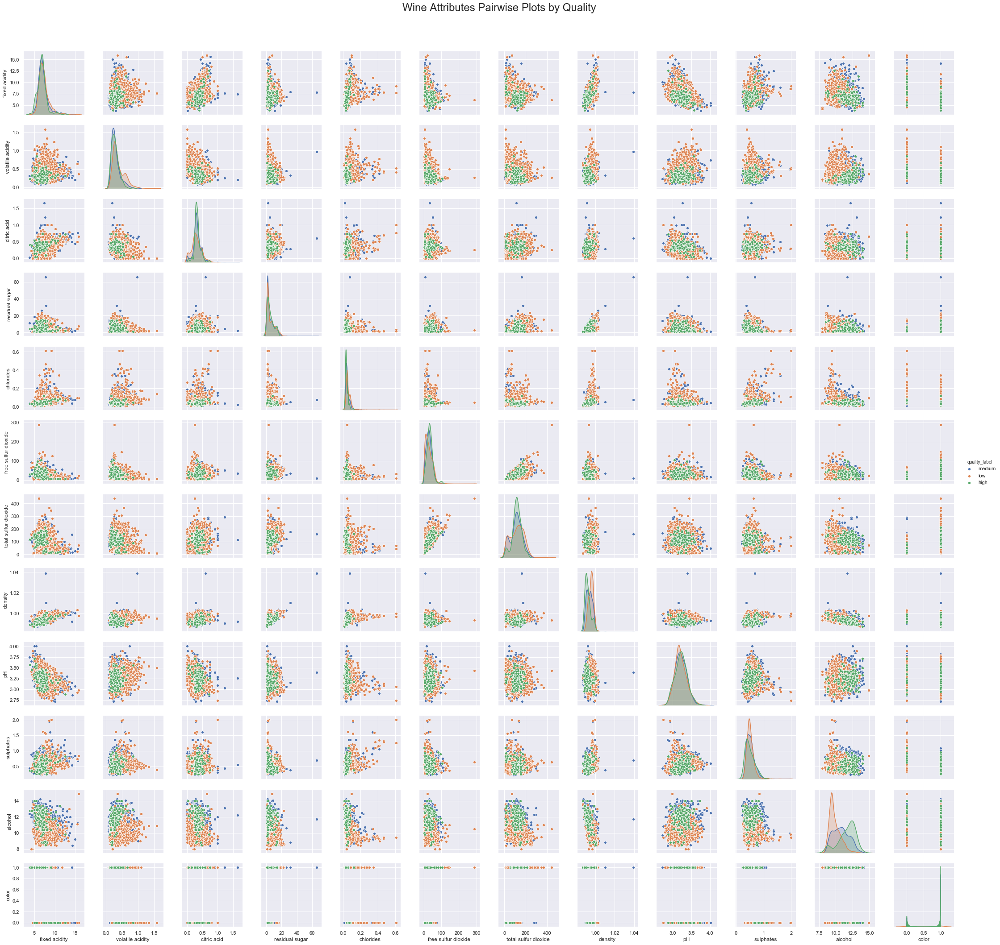

In [ ]:
corr = wines.corr()
top_corr_cols = corr.quality.sort_values(ascending=False).keys() 
top_corr = corr.loc[top_corr_cols, top_corr_cols]
dropSelf = np.zeros_like(top_corr)
dropSelf[np.triu_indices_from(dropSelf)] = True
plt.figure(figsize=(18, 10))
sns.heatmap(top_corr, cmap=sns.diverging_palette(220, 10, as_cmap=True), annot=True, fmt=".2f", mask=dropSelf)
sns.set(font_scale=1.5)

sns.set(font_scale=1.0)
cols = wines.columns
cols = cols.drop('quality')
g = sns.pairplot(data = wines.loc[:, cols], hue='quality_label')
fig = g.fig 
fig.subplots_adjust(top=0.93, wspace=0.3)
t = fig.suptitle('Wine Attributes Pairwise Plots by Quality', fontsize=24)

plt.show()

del corr, dropSelf, top_corr, g, fig, t

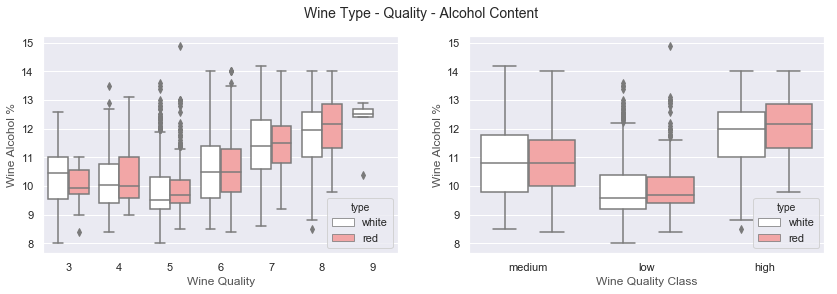

In [ ]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 4))
f.suptitle('Wine Type - Quality - Alcohol Content', fontsize=14)

sns.boxplot(x='quality', y='alcohol', hue='type', data=wines, palette={"red": "#FF9999", "white": "white"}, ax=ax1)
ax1.set_xlabel("Wine Quality",size = 12,alpha=0.8)
ax1.set_ylabel("Wine Alcohol %",size = 12,alpha=0.8)

sns.boxplot(x='quality_label', y='alcohol', hue='type', data=wines, palette={"red": "#FF9999", "white": "white"}, ax=ax2)
ax2.set_xlabel("Wine Quality Class",size = 12,alpha=0.8)
ax2.set_ylabel("Wine Alcohol %",size = 12,alpha=0.8)
plt.show()


Let's see visualizing relationships between wine types, quality and acidity:

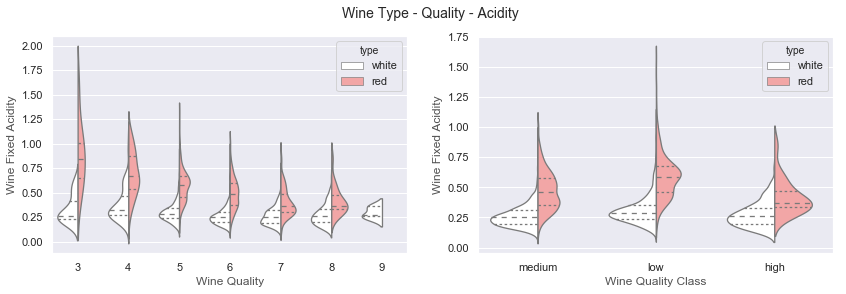

In [ ]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 4))
f.suptitle('Wine Type - Quality - Acidity', fontsize=14)

sns.violinplot(x='quality', y='volatile acidity', hue='type', data=wines, split=True, inner='quart', linewidth=1.3,
               palette={'red': '#FF9999', 'white': 'white'}, ax=ax1)
ax1.set_xlabel("Wine Quality",size = 12,alpha=0.8)
ax1.set_ylabel("Wine Fixed Acidity",size = 12,alpha=0.8)

sns.violinplot(x='quality_label', y='volatile acidity', hue='type', data=wines, split=True, inner='quart', linewidth=1.3,
               palette={'red': '#FF9999', 'white': 'white'}, ax=ax2)
ax2.set_xlabel("Wine Quality Class",size = 12,alpha=0.8)
ax2.set_ylabel("Wine Fixed Acidity",size = 12,alpha=0.8)
plt.show()

It is quite evident that red wine samples have higher acidity as compared to its white wine counterparts. Also we can see an overall decrease in acidity with higher quality wine for red wine samples but not so much for white wine samples. 

Let's see this obsevation in some 3 variabels graphs analysis:

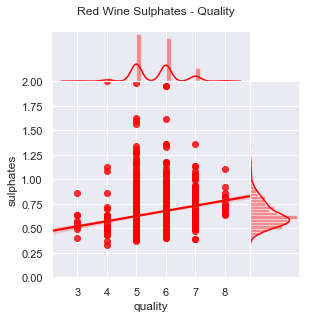

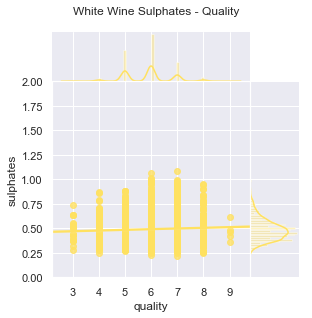

In [ ]:
r = sns.jointplot(x='quality', y='sulphates', data=wines[wines.color == 0], # , ax = ax
                  kind='reg', ylim=(0, 2), color='red', space=0, size=4.5, ratio=4)
r.ax_joint.set_xticks(list(range(3,9)))
rfig = r.fig 
rfig.subplots_adjust(top=0.9)
t = rfig.suptitle('Red Wine Sulphates - Quality', fontsize=12)

w = sns.jointplot(x='quality', y='sulphates', data=wines[wines.color == 1],
                   kind='reg', ylim=(0, 2), color='#FFE160', space=0, size=4.5, ratio=4)
w.ax_joint.set_xticks(list(range(3,10)))
wfig = w.fig 
wfig.subplots_adjust(top=0.9)
t = wfig.suptitle('White Wine Sulphates - Quality', fontsize=12)

While there seems to be some pattern depicting a slight higer sulphate levels for higher quality rated wine samples, the correlation is quite weak. However, we do see this tendecy is caused by higer concentartion on medium quality, and a clearly see that sulphate levels for red wine are much higher as compared to the ones in white wine. 

Let's see this obsevation in some 4 variabels graphs analysis:

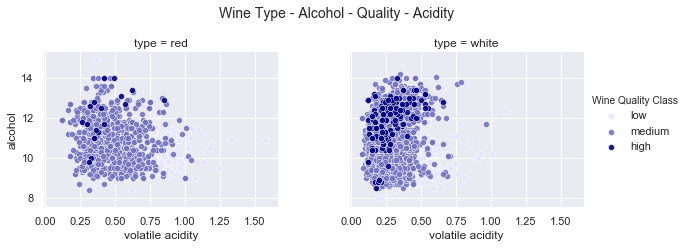

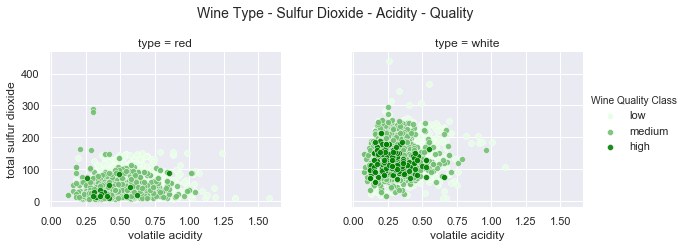

In [ ]:
g = sns.FacetGrid(wines, col='type', hue='quality_label', col_order=['red', 'white'], hue_order=['low', 'medium', 'high'],
                  aspect=1.2, size=3.5, palette=sns.light_palette('navy', 3))
g.map(plt.scatter, 'volatile acidity', 'alcohol', alpha=0.9, edgecolor='white', linewidth=0.5)
fig = g.fig
fig.subplots_adjust(top=0.8, wspace=0.3)
fig.suptitle('Wine Type - Alcohol - Quality - Acidity', fontsize=14)
l = g.add_legend(title='Wine Quality Class')

g = sns.FacetGrid(wines, col='type', hue='quality_label', col_order=['red', 'white'], hue_order=['low', 'medium', 'high'],
                  aspect=1.2, size=3.5, palette=sns.light_palette('green', 3))
g.map(plt.scatter, "volatile acidity", "total sulfur dioxide", alpha=0.9, edgecolor='white', linewidth=0.5)
fig = g.fig 
fig.subplots_adjust(top=0.8, wspace=0.3)
fig.suptitle('Wine Type - Sulfur Dioxide - Acidity - Quality', fontsize=14)
l = g.add_legend(title='Wine Quality Class')

From the first pair graphs we can see that higher quality wine samples have lower levels of volatile acidity and higher levels of alcohol content as compared to wine samples with medium and low ratings. Besides this, we can also see that volatile acidity levels are slightly lower in white wine samples as compared to red wine samples.

In the second pair graph, the volatile acidity as well as total sulfur dioxide is considerably lower in high quality wine samples. Also, total sulfur dioxide is considerable more in white wine samples as compared to red wine samples. However, volatile acidity levels are slightly lower in white wine samples as compared to red wine samples we also observed in the previous plot.

## Data Engineering - Cleaning, Transforming, Selection and Reduction
### Box cox transformation of highly skewed features


In [ ]:
numeric_features = list(wines.dtypes[(wines.dtypes != "str") & (wines.dtypes !='object')].index)
numeric_features.remove('color')

skewed_features = wines[numeric_features].apply(lambda x : skew (x.dropna())).sort_values(ascending=False)

#compute skewness
skewness = pd.DataFrame({'Skew' :skewed_features})   

# Get only higest skewed features
skewness = skewness[abs(skewness) > 0.7]
skewness = skewness.dropna()
print ("There are {} higest skewed numerical features to box cox transform".format(skewness.shape[0]))

l_opt = {}

for feat in skewness.index:
    wines[feat], l_opt[feat] = boxcox((wines[feat]+1))

skewed_features2 = wines[skewness.index].apply(lambda x : skew (x.dropna())).sort_values(ascending=False)

#compute skewness
skewness2 = pd.DataFrame({'New Skew' :skewed_features2})   
display(pd.concat([skewness, skewness2], axis=1).sort_values(by=['Skew'], ascending=False))

There are 6 higest skewed numerical features to box cox transform


,Skew,New Skew
chlorides,5.402178,0.188541
sulphates,1.802523,0.010381
fixed acidity,1.721248,-0.062754
volatile acidity,1.499692,0.113617
residual sugar,1.436792,0.136151
free sulfur dioxide,1.223143,-0.036825


As you can see, we were able at first to bring most the numerical values closer to normal. Maybe you're not satisfied with the results and want to understand if we really need to continue to transform some discrete data. So, let's take a look at the QQ test of these features.

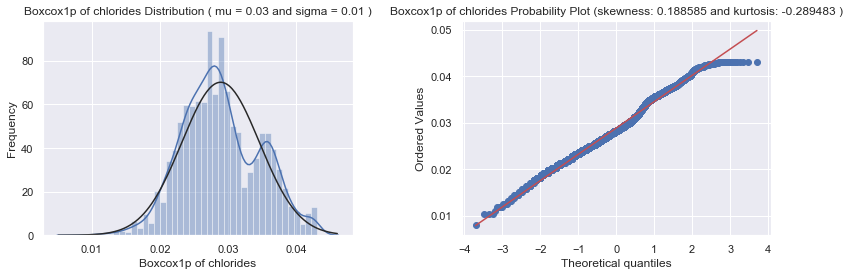

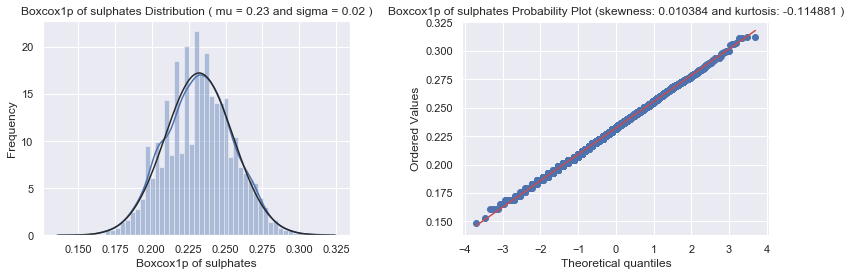

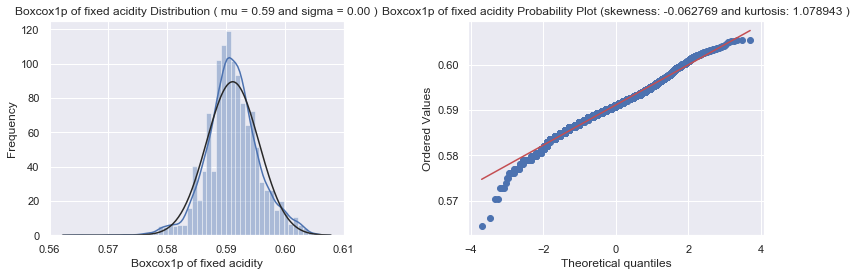

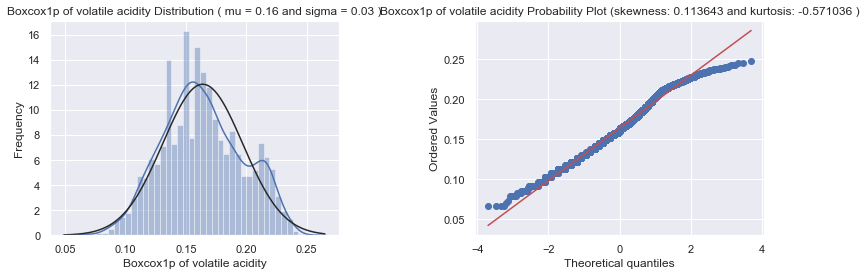

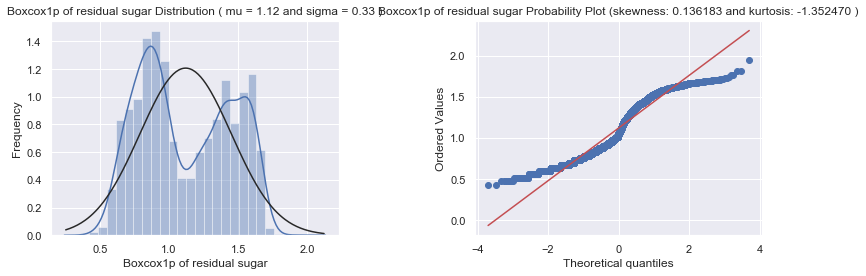

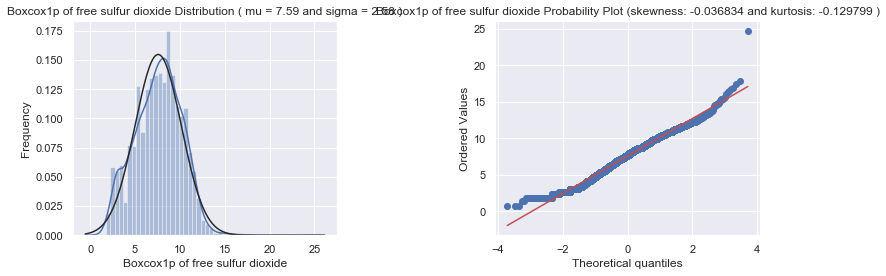

In [ ]:
def QQ_plot(data, measure):
    fig = plt.figure(figsize=(12,4))

    #Get the fitted parameters used by the function
    (mu, sigma) = norm.fit(data)

    #Kernel Density plot
    fig1 = fig.add_subplot(121)
    sns.distplot(data, fit=norm)
    fig1.set_title(measure + ' Distribution ( mu = {:.2f} and sigma = {:.2f} )'.format(mu, sigma), loc='center')
    fig1.set_xlabel(measure)
    fig1.set_ylabel('Frequency')

    #QQ plot
    fig2 = fig.add_subplot(122)
    res = probplot(data, plot=fig2)
    fig2.set_title(measure + ' Probability Plot (skewness: {:.6f} and kurtosis: {:.6f} )'.\
                   format(data.skew(), data.kurt()), loc='center')

    plt.tight_layout()
    plt.show()
    
for feat in skewness.index:
    QQ_plot(wines[feat], ('Boxcox1p of {}'.format(feat)))

As you can see, in addition to having presented significant improvements, they also pass the QQ test and present interesting distributions as we can observe in their respective graphs.

So, we can continue to apply the BoxCox on this features.

### Identify  and treat multicollinearity:


In [ ]:
from patsy import dmatrices
from statsmodels.stats.outliers_influence import variance_inflation_factor

def VRF(predict, data, y):
   
    scale = StandardScaler(with_std=False)
    df = pd.DataFrame(scale.fit_transform(data), columns= cols)
    features = "+".join(cols)
    df['quality_label'] = y.values

    # get y and X dataframes based on this regression:
    y, X = dmatrices(predict + ' ~' + features, data = df, return_type='dataframe')

   # Calculate VIF Factors
    # For each X, calculate VIF and save in dataframe
    vif = pd.DataFrame()
    vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif["features"] = X.columns

    # Inspect VIF Factors
    display(vif.sort_values('VIF Factor'))
    return vif

cols = wines.columns.str.replace(' ', '_')
df = wines.copy()
df.columns = cols
# Remove the not applied to the qualty classification task
cols = list(cols.drop(['type', 'quality_label', 'quality']))

vif = VRF('quality_label', df.loc[:, cols], y_ql)

,VIF Factor,features
0,1.000000,Intercept
3,1.456483,citric_acid
10,1.459199,sulphates
2,1.913981,volatile_acidity
9,1.922427,pH
6,2.496617,free_sulfur_dioxide
5,2.561999,chlorides
1,2.726160,fixed_acidity
11,3.658381,alcohol
4,3.811469,residual_sugar


In [ ]:
cols = wines.columns.str.replace(' ', '_')
df = wines.copy()
df.columns = cols
# Remove the higest correlations and run a multiple regression
cols = list(cols.drop(['type', 'quality_label', 'quality', 'residual_sugar', 'total_sulfur_dioxide']))

vif = VRF('quality_label', df.loc[:, cols], y_ql)

del df

,VIF Factor,features
0,1.000000,Intercept
8,1.402620,sulphates
3,1.433664,citric_acid
5,1.532415,free_sulfur_dioxide
7,1.658454,pH
2,1.809226,volatile_acidity
1,2.254045,fixed_acidity
4,2.512481,chlorides
9,2.649799,alcohol
6,3.314295,density


### Feature Selection into the Pipeline


In [ ]:
class select_fetaures(object): # BaseEstimator, TransformerMixin, 
    def __init__(self, select_cols):
        self.select_cols_ = select_cols
    
    def fit(self, X, Y ):
        pass

    def transform(self, X):
        return X.loc[:, self.select_cols_]    

    def fit_transform(self, X, Y):
        self.fit(X, Y)
        df = self.transform(X)
        return df    

    def __getitem__(self, x):
        return self.X[x], self.Y[x]

### Dimensionality Reduction

#### PCA


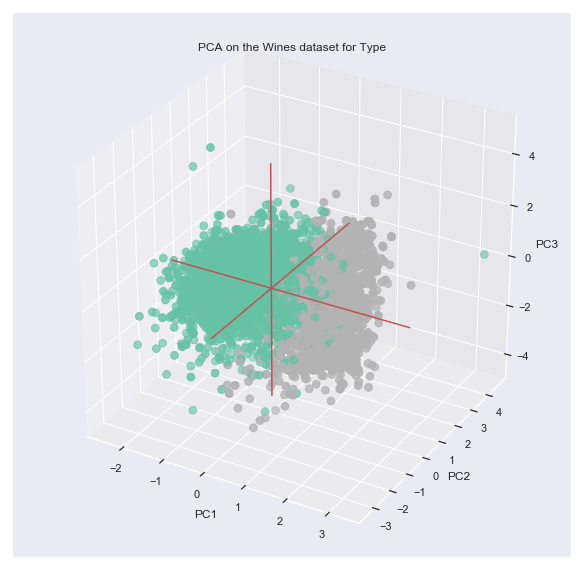

KNeighbors Classifier Training Accuracy: 99.98%
KNeighbors Classifier Test Accuracy: 99.33%
________________________________________

Accurance on Type  Prediction By Number of PCA COmponents:



,Var_ratio,Train_Acc,Test_Acc
Components,,,
11,99.427453,0.999779,0.993811
10,97.667786,0.999779,0.993296
8,91.839268,0.999779,0.991748
9,95.160591,0.999779,0.990717
6,82.997327,0.999779,0.989170
7,87.723789,0.999779,0.989170
4,70.692560,0.999779,0.988138
5,77.709477,0.999779,0.987622
3,61.525142,0.999779,0.985560


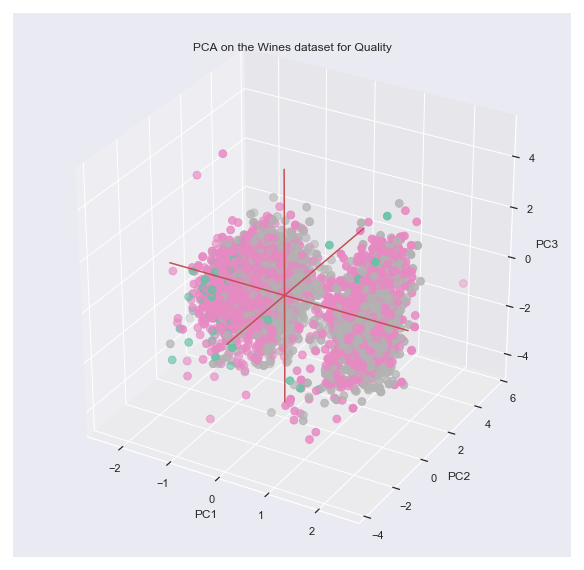

KNeighbors Classifier Training Accuracy: 100.00%
KNeighbors Classifier Test Accuracy: 78.29%
________________________________________

Accurance on Quality  Prediction By Number of PCA COmponents:



,Var_ratio,Train_Acc,Test_Acc
Components,,,
10,98.577969,1.0,0.784425
11,99.485315,1.0,0.782878
6,85.704486,1.0,0.777205
9,96.547242,1.0,0.773079
8,93.557958,1.0,0.768437
5,80.594934,1.0,0.767922
7,90.053091,1.0,0.764827
4,74.622660,1.0,0.755028
3,66.550688,1.0,0.733368


In [ ]:
def pca_analysis(df, y_train, feat):
    scale = StandardScaler()
    df = pd.DataFrame(scale.fit_transform(df), index=df.index)
    pca_all = PCA(random_state=101, whiten=True).fit(df)

    my_color=y_train

    # Store results of PCA in a data frame
    result=pd.DataFrame(pca_all.transform(df), columns=['PCA%i' % i for i in range(df.shape[1])], index=df.index)

    # Plot initialisation
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(result['PCA0'], result['PCA1'], result['PCA2'], c=my_color, cmap="Set2_r", s=60)

    # make simple, bare axis lines through space:
    xAxisLine = ((min(result['PCA0']), max(result['PCA0'])), (0, 0), (0,0))
    ax.plot(xAxisLine[0], xAxisLine[1], xAxisLine[2], 'r')
    yAxisLine = ((0, 0), (min(result['PCA1']), max(result['PCA1'])), (0,0))
    ax.plot(yAxisLine[0], yAxisLine[1], yAxisLine[2], 'r')
    zAxisLine = ((0, 0), (0,0), (min(result['PCA2']), max(result['PCA2'])))
    ax.plot(zAxisLine[0], zAxisLine[1], zAxisLine[2], 'r')

    # label the axes
    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")
    ax.set_zlabel("PC3")
    ax.set_title("PCA on the Wines dataset for " + (feat))
    plt.show()

    X_train , X_test, y, y_test = train_test_split(df , y_train, test_size=0.3, random_state=0)

    KNC = KNeighborsClassifier(algorithm = 'ball_tree', leaf_size = 12, n_neighbors = 12, p  = 1, weights = 'distance')
    KNC = KNC.fit(X_train, y)
    print('KNeighbors Classifier Training Accuracy: {:2.2%}'.format(accuracy_score(y, KNC.predict(X_train))))
    y_pred = KNC.predict(X_test)
    print('KNeighbors Classifier Test Accuracy: {:2.2%}'.format(accuracy_score(y_test, y_pred)))

    print('_' * 40)
    print('\nAccurance on', feat, ' Prediction By Number of PCA COmponents:\n')
    AccPca = pd.DataFrame(columns=['Components', 'Var_ratio', 'Train_Acc', 'Test_Acc'])

    for componets in np.arange(1, df.shape[1]):
        variance_ratio = sum(pca_all.explained_variance_ratio_[:componets])*100
        pca = PCA(n_components=componets, random_state=101, whiten=True)
        X_train_pca = pca.fit_transform(X_train)
        Components = X_train_pca.shape[1]
        KNC = KNeighborsClassifier(algorithm = 'ball_tree', leaf_size = 12, n_neighbors = 12, p  = 1, weights = 'distance')
        KNC = KNC.fit(X_train_pca, y)
        Training_Accuracy = accuracy_score(y, KNC.predict(X_train_pca))
        X_test_pca = pca.transform(X_test)
        y_pred = KNC.predict(X_test_pca)
        Test_Accuracy = accuracy_score(y_test, y_pred)
        AccPca = AccPca.append(pd.DataFrame([(Components, variance_ratio, Training_Accuracy, Test_Accuracy)],
                                            columns=['Components', 'Var_ratio', 'Train_Acc', 'Test_Acc']))#], axis=0)

    AccPca.set_index('Components', inplace=True)
    display(AccPca.sort_values(by='Test_Acc', ascending=False))

cols = wines.columns
cols = list(cols.drop(['type', 'quality_label', 'color']))
pca_analysis(wines.loc[:, cols], y_tp, 'Type')

cols = wines.columns
cols = list(cols.drop(['type', 'quality_label', 'quality']))
pca_analysis(wines.loc[:, cols], y_ql, 'Quality')

#### Linear Discriminant Analysis (LDA)


KNC Training Accuracy: 99.98%
KNC Test Accuracy: 97.01%
________________________________________

Apply LDA:

Number of features after LDA: 1
LR Training Accuracy With LDA: 99.98%
LR Test Accuracy With LDA: 99.33%


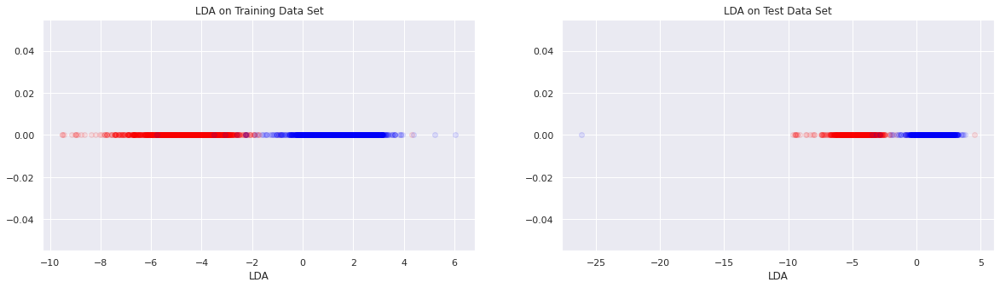

KNC Training Accuracy: 100.00%
KNC Test Accuracy: 73.90%
________________________________________

Apply LDA:

Number of features after LDA: 2
LR Training Accuracy With LDA: 100.00%
LR Test Accuracy With LDA: 75.45%


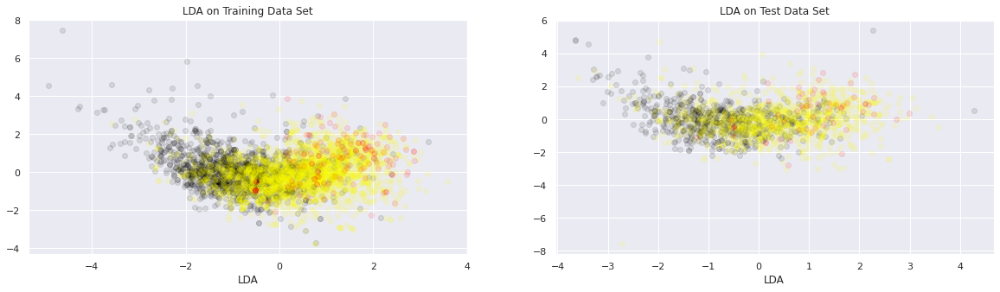

In [ ]:
def LDA_analysis(df, y_train, feat):
    X_train , X_test, y, y_test = train_test_split(df , y_train, test_size=0.3, random_state=0)

    KNC = KNeighborsClassifier(algorithm = 'ball_tree', leaf_size = 12, n_neighbors = 12, p  = 1, weights = 'distance')
    KNC = KNC.fit(X_train, y)
    print('KNC Training Accuracy: {:2.2%}'.format(accuracy_score(y, KNC.predict(X_train))))
    y_pred = KNC.predict(X_test)
    print('KNC Test Accuracy: {:2.2%}'.format(accuracy_score(y_test, y_pred)))
    print('_' * 40)
    print('\nApply LDA:\n')
    lda = LDA(n_components=2, store_covariance=True)
    X_train_lda = lda.fit_transform(X_train, y)
    #X_train_lda = pd.DataFrame(X_train_lda)

    print('Number of features after LDA:',X_train_lda.shape[1])
    KNC = KNeighborsClassifier(algorithm = 'ball_tree', leaf_size = 12, n_neighbors = 12, p  = 1, weights = 'distance')
    KNCr = KNC.fit(X_train_lda, y)
    print('LR Training Accuracy With LDA: {:2.2%}'.format(accuracy_score(y, KNC.predict(X_train_lda))))
    X_test_lda = lda.transform(X_test)
    y_pred = KNC.predict(X_test_lda)
    print('LR Test Accuracy With LDA: {:2.2%}'.format(accuracy_score(y_test, y_pred)))

    if X_train_lda.shape[1]==1:
        fig = plt.figure(figsize=(20,5))
        fig.add_subplot(121)
        plt.scatter(X_train_lda[y==0, 0], np.zeros((len(X_train_lda[y==0, 0]),1)), color='red', alpha=0.1)
        plt.scatter(X_train_lda[y==1, 0], np.zeros((len(X_train_lda[y==1, 0]),1)), color='blue', alpha=0.1)
        plt.title('LDA on Training Data Set')
        plt.xlabel('LDA')
        fig.add_subplot(122)
        plt.scatter(X_test_lda[y_test==0, 0], np.zeros((len(X_test_lda[y_test==0, 0]),1)), color='red', alpha=0.1)
        plt.scatter(X_test_lda[y_test==1, 0], np.zeros((len(X_test_lda[y_test==1, 0]),1)), color='blue', alpha=0.1)
        plt.title('LDA on Test Data Set')
        plt.xlabel('LDA')
    else:
        fig = plt.figure(figsize=(20,5))
        fig.add_subplot(121)
        plt.scatter(X_train_lda[y==0, 0], X_train_lda[y==0, 1], color='black', alpha=0.1)
        plt.scatter(X_train_lda[y==1, 0], X_train_lda[y==1, 1], color='yellow', alpha=0.1)
        plt.scatter(X_train_lda[y==2, 0], X_train_lda[y==2, 1], color='red', alpha=0.1)
        plt.title('LDA on Training Data Set')
        plt.xlabel('LDA')
        fig.add_subplot(122)
        plt.scatter(X_test_lda[y_test==0, 0], X_test_lda[y_test==0, 1], color='black', alpha=0.1)
        plt.scatter(X_test_lda[y_test==1, 0], X_test_lda[y_test==1, 1], color='yellow', alpha=0.1)
        plt.scatter(X_test_lda[y_test==2, 0], X_test_lda[y_test==2, 1], color='red', alpha=0.1)
        plt.title('LDA on Test Data Set')
        plt.xlabel('LDA')

    plt.show()
    
cols = wines.columns
cols = list(cols.drop(['type', 'quality_label', 'color']))
LDA_analysis(wines.loc[:, cols], y_tp, 'Type')

cols = wines.columns
cols = list(cols.drop(['type', 'quality_label', 'quality']))
LDA_analysis(wines.loc[:, cols], y_ql, 'Quality')

## Modeling
- Implement classifiers models
- Use hyper parametrization
- Cross validation 
- Compare the results between different errors measures.

###Get Results
- The mean best accuracy and best parameters got through the grid  search CV 
- The model performance metrics Accuracy, Precision, Recall and F1 Score
- The model Classification scores by classes 
- The prediction confusion matrix
- The ROC AUC Score and the ROC Curve
- Features importance plot



In [ ]:
def get_results(model, name, data, true_labels, target_names = ['red', 'white'], results=None, reasume=False):

    if hasattr(model, 'layers'):
        param = wtp_dnn_model.history.params
        best = np.mean(wtp_dnn_model.history.history['val_accuracy'])
        predicted_labels = model.predict_classes(data) 
        im_model = InMemoryModel(model.predict, examples=data, target_names=target_names)

    else:
        param = gs.best_params_
        best = gs.best_score_
        predicted_labels = model.predict(data).ravel()
        if hasattr(model, 'predict_proba'):
            im_model = InMemoryModel(model.predict_proba, examples=data, target_names=target_names)
        elif hasattr(clf, 'decision_function'):
            im_model = InMemoryModel(model.decision_function, examples=data, target_names=target_names)
        
    print('Mean Best Accuracy: {:2.2%}'.format(best))
    print('-'*60)
    print('Best Parameters:')
    print(param)
    print('-'*60)
    
    y_pred = model.predict(data).ravel()
    
    display_model_performance_metrics(true_labels, predicted_labels = predicted_labels, target_names = target_names)
    if len(target_names)==2:
        ras = roc_auc_score(y_true=true_labels, y_score=y_pred)
    else:
        roc_auc_multiclass, ras = roc_auc_score_multiclass(y_true=true_labels, y_score=y_pred, target_names=target_names)
        print('\nROC AUC Score by Classes:\n',roc_auc_multiclass)
        print('-'*60)

    print('\n\n              ROC AUC Score: {:2.2%}'.format(ras))
    prob, score_roc, roc_auc = plot_model_roc_curve(model, data, true_labels, label_encoder=None, class_names=target_names)
    
    interpreter = Interpretation(data, feature_names=cols)
    plots = interpreter.feature_importance.plot_feature_importance(im_model, progressbar=False, n_jobs=1, ascending=True)
    
    r1 = pd.DataFrame([(prob, best, np.round(accuracy_score(true_labels, predicted_labels), 4), 
                         ras, roc_auc)], index = [name],
                         columns = ['Prob', 'CV Accuracy', 'Accuracy', 'ROC AUC Score', 'ROC Area'])
    if reasume:
        results = r1
    elif (name in results.index):        
        results.loc[[name], :] = r1
    else: 
        results = results.append(r1)
        
    return results

def roc_auc_score_multiclass(y_true, y_score, target_names, average = "macro"):

  #creating a set of all the unique classes using the actual class list
  unique_class = set(y_true)
  roc_auc_dict = {}
  mean_roc_auc = 0
  for per_class in unique_class:
    #creating a list of all the classes except the current class 
    other_class = [x for x in unique_class if x != per_class]

    #marking the current class as 1 and all other classes as 0
    new_y_true = [0 if x in other_class else 1 for x in y_true]
    new_y_score = [0 if x in other_class else 1 for x in y_score]
    num_new_y_true = sum(new_y_true)

    #using the sklearn metrics method to calculate the roc_auc_score
    roc_auc = roc_auc_score(new_y_true, new_y_score, average = average)
    roc_auc_dict[target_names[per_class]] = np.round(roc_auc, 4)
    mean_roc_auc += num_new_y_true * np.round(roc_auc, 4)
    
  mean_roc_auc = mean_roc_auc/len(y_true)  
  return roc_auc_dict, mean_roc_auc

def get_metrics(true_labels, predicted_labels):
    
    print('Accuracy:  {:2.2%} '.format(metrics.accuracy_score(true_labels, predicted_labels)))
    print('Precision: {:2.2%} '.format(metrics.precision_score(true_labels, predicted_labels, average='weighted')))
    print('Recall:    {:2.2%} '.format(metrics.recall_score(true_labels, predicted_labels, average='weighted')))
    print('F1 Score:  {:2.2%} '.format(metrics.f1_score(true_labels, predicted_labels, average='weighted')))
                        

def train_predict_model(classifier,  train_features, train_labels,  test_features, test_labels):
    # build model    
    classifier.fit(train_features, train_labels)
    # predict using model
    predictions = classifier.predict(test_features) 
    return predictions    


def display_confusion_matrix(true_labels, predicted_labels, target_names):
    
    total_classes = len(target_names)
    level_labels = [total_classes*[0], list(range(total_classes))]

    cm = metrics.confusion_matrix(y_true=true_labels, y_pred=predicted_labels)
    cm_frame = pd.DataFrame(data=cm, 
                            columns=pd.MultiIndex(levels=[['Predicted:'], target_names], codes=level_labels), 
                            index=pd.MultiIndex(levels=[['Actual:'], target_names], codes=level_labels)) 
    print(cm_frame) 
    
def display_classification_report(true_labels, predicted_labels, target_names):

    report = metrics.classification_report(y_true=true_labels, y_pred=predicted_labels, target_names=target_names) 
    print(report)
    
def display_model_performance_metrics(true_labels, predicted_labels, target_names):
    print('Model Performance metrics:')
    print('-'*30)
    get_metrics(true_labels=true_labels, predicted_labels=predicted_labels)
    print('\nModel Classification report:')
    print('-'*30)
    display_classification_report(true_labels=true_labels, predicted_labels=predicted_labels, target_names=target_names)
    print('\nPrediction Confusion Matrix:')
    print('-'*30)
    display_confusion_matrix(true_labels=true_labels, predicted_labels=predicted_labels, target_names=target_names)


def plot_model_roc_curve(clf, features, true_labels, label_encoder=None, class_names=None):
    
    ## Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    if hasattr(clf, 'classes_'):
        class_labels = clf.classes_
    elif label_encoder:
        class_labels = label_encoder.classes_
    elif class_names:
        class_labels = class_names
    else:
        raise ValueError('Unable to derive prediction classes, please specify class_names!')
    n_classes = len(class_labels)
   
    if n_classes == 2:
        if hasattr(clf, 'predict_proba'):
            prb = clf.predict_proba(features)
            if prb.shape[1] > 1:
                y_score = prb[:, prb.shape[1]-1] 
            else:
                y_score = clf.predict(features).ravel()
            prob = True
        elif hasattr(clf, 'decision_function'):
            y_score = clf.decision_function(features)
            prob = False
        else:
            raise AttributeError("Estimator doesn't have a probability or confidence scoring system!")
        
        fpr, tpr, _ = roc_curve(true_labels, y_score)      
        roc_auc = auc(fpr, tpr)

        plt.plot(fpr, tpr, label='ROC curve (area = {0:3.2%})'.format(roc_auc), linewidth=2.5)
        
    elif n_classes > 2:
        if  hasattr(clf, 'clfs_'):
            y_labels = label_binarize(true_labels, classes=list(range(len(class_labels))))
        else:
            y_labels = label_binarize(true_labels, classes=class_labels)
        if hasattr(clf, 'predict_proba'):
            y_score = clf.predict_proba(features)
            prob = True
        elif hasattr(clf, 'decision_function'):
            y_score = clf.decision_function(features)
            prob = False
        else:
            raise AttributeError("Estimator doesn't have a probability or confidence scoring system!")
            
        for i in range(n_classes):
            fpr[i], tpr[i], _ = roc_curve(y_labels[:, i], y_score[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])

        ## Compute micro-average ROC curve and ROC area
        fpr["micro"], tpr["micro"], _ = roc_curve(y_labels.ravel(), y_score.ravel())
        roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

        ## Compute macro-average ROC curve and ROC area
        # First aggregate all false positive rates
        all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
        # Then interpolate all ROC curves at this points
        mean_tpr = np.zeros_like(all_fpr)
        for i in range(n_classes):
            mean_tpr += interp(all_fpr, fpr[i], tpr[i])
        # Finally average it and compute AUC
        mean_tpr /= n_classes
        fpr["macro"] = all_fpr
        tpr["macro"] = mean_tpr
        roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

        ## Plot ROC curves
        plt.figure(figsize=(6, 4))
        plt.plot(fpr["micro"], tpr["micro"], label='micro-average ROC curve (area = {0:2.2%})'
                       ''.format(roc_auc["micro"]), linewidth=3)

        plt.plot(fpr["macro"], tpr["macro"], label='macro-average ROC curve (area = {0:2.2%})'
                       ''.format(roc_auc["macro"]), linewidth=3)

        for i, label in enumerate(class_names):
            plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:2.2%})'
                                           ''.format(label, roc_auc[i]), linewidth=2, linestyle=':')
        roc_auc = roc_auc["macro"]   
    else:
        raise ValueError('Number of classes should be atleast 2 or more')
        
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([-0.01, 1.0])
    plt.ylim([0.0, 1.01])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")
    plt.show()
    
    return prob, y_score, roc_auc

### Hyper Parametrization




### Wine Type Classifier Models:


In [ ]:
cols = wines.columns
cols = list(cols.drop(['type', 'quality_label', 'color']))
X_train, X_test, y_train, y_test = train_test_split(wines.loc[:, cols], y_tp, test_size=0.20, random_state=101)

#### Logistic Regression


Fitting 5 folds for each of 456 candidates, totalling 2280 fits


[Parallel(n_jobs=4)]: Done  76 tasks      | elapsed:    2.7s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:   13.7s
[Parallel(n_jobs=4)]: Done 876 tasks      | elapsed:   30.2s
[Parallel(n_jobs=4)]: Done 1576 tasks      | elapsed:   52.4s
[Parallel(n_jobs=4)]: Done 2280 out of 2280 | elapsed:  1.2min finished


Mean Best Accuracy: 99.52%
------------------------------------------------------------
Best Parameters:
{'clf__C': 0.009, 'clf__class_weight': None, 'clf__penalty': 'l2', 'clf__solver': 'liblinear', 'clf__tol': 0.001, 'pca__n_components': 12, 'pca__whiten': True}
------------------------------------------------------------
Model Performance metrics:
------------------------------
Accuracy:  99.30% 
Precision: 99.31% 
Recall:    99.30% 
F1 Score:  99.30% 

Model Classification report:
------------------------------
              precision    recall  f1-score   support

         red       0.98      0.99      0.99       327
       white       1.00      0.99      1.00       966

    accuracy                           0.99      1293
   macro avg       0.99      0.99      0.99      1293
weighted avg       0.99      0.99      0.99      1293


Prediction Confusion Matrix:
------------------------------
              Predicted:      
                     red white
Actual: red          324     

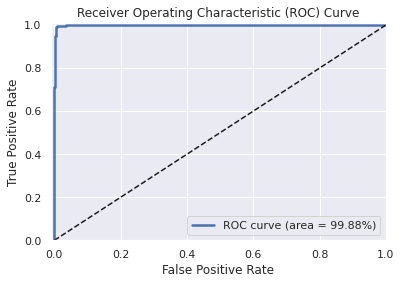

2020-12-20 18:55:57,290 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


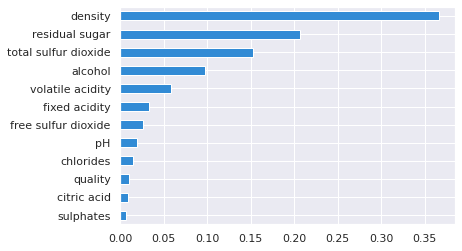

In [ ]:
clf = Pipeline([
        ('pca', PCA(random_state = 101)),
        ('clf', LogisticRegression(random_state=101))])  

# a list of dictionaries to specify the parameters that we'd want to tune
n_components= [10, 12]
whiten = [True] #, False]
C =  [0.003, 0.009, 0.01]#, 0.1, 1.0, 10.0, 100.0, 1000.0]
tol = [0.001, 0.0001] # [1e-06, 5e-07, 1e-05, 1e-04, 1e-03, 1e-02, 1e-01]

param_grid =\
    [{'clf__C': C
     ,'clf__solver': ['liblinear', 'saga'] 
     ,'clf__penalty': ['l1', 'l2']
     ,'clf__tol' : tol 
     ,'clf__class_weight': [None, 'balanced']
     ,'pca__n_components' : n_components
     ,'pca__whiten' : whiten
},
    {'clf__C': C
     ,'clf__max_iter': [3, 9, 2, 7, 4]
     ,'clf__solver': ['newton-cg', 'sag', 'lbfgs']
     ,'clf__penalty': ['l2']
     ,'clf__tol' : tol 
     ,'clf__class_weight': [None, 'balanced'] 
     ,'pca__n_components' : n_components
     ,'pca__whiten' : whiten
}]

gs = GridSearchCV(estimator=clf, param_grid=param_grid, scoring='accuracy', cv=5, verbose=1, n_jobs=4)
LR = Pipeline([
        #('sel', select_fetaures(select_cols=list(shadow))),
        ('scl', StandardScaler()),
        #('lda', LDA(store_covariance=True)),
        ('gs', gs)
 ]) 

LR.fit(X_train,y_train)

results = get_results(LR, 'LogisticRegression', X_test, y_test, reasume=True)

#### Deep Neural Network



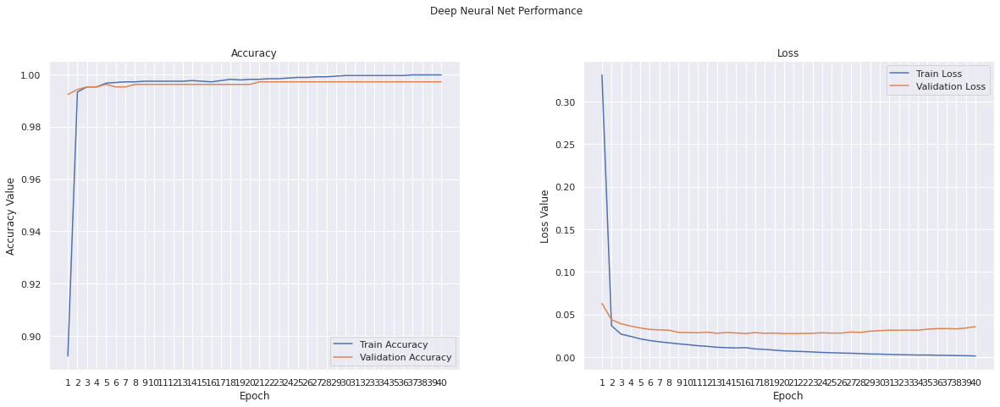

In [ ]:
# Define the scaler 
wtp_ss = StandardScaler().fit(X_train)

# Scale the train set
X_train_Ss = wtp_ss.transform(X_train)

# Scale the test set
X_test_Ss = wtp_ss.transform(X_test)

wtp_dnn_model = Sequential()
wtp_dnn_model.add(Dense(64, activation='relu', input_shape=(12,)))
wtp_dnn_model.add(Dense(32, activation='relu'))
wtp_dnn_model.add(Dense(16, activation='relu'))
wtp_dnn_model.add(Dense(1, activation='sigmoid'))

wtp_dnn_model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

epochs=40
history = wtp_dnn_model.fit(X_train_Ss, y_train, epochs=epochs, batch_size=50, 
                            shuffle=True, validation_split=0.2, verbose=0)

wtp_dnn_ypred = wtp_dnn_model.predict_classes(X_test_Ss)
wtp_dnn_predictions = class_tp.inverse_transform(wtp_dnn_ypred) 

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))
t = f.suptitle('Deep Neural Net Performance', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epochs = list(range(1,epochs+1))
ax1.plot(epochs, history.history['accuracy'], label='Train Accuracy')
ax1.plot(epochs, history.history['val_accuracy'], label='Validation Accuracy')
ax1.set_xticks(epochs)
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epochs, history.history['loss'], label='Train Loss')
ax2.plot(epochs, history.history['val_loss'], label='Validation Loss')
ax2.set_xticks(epochs)
ax2.set_ylabel('Loss Value')
ax2.set_xlabel('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")



From the accuracy and loss plot, you can note that we can stop the learning process at 40<sup>th</sup> or 23<sup>th</sup> epoch, given that at some point the model seems to be tending to overfit if we continue.

Let's get our standard report and check if the DNN models after  40<sup>th</sup> can gave us a good generalization.

In [ ]:
results = get_results(wtp_dnn_model, 'DNN Regressor', X_test_Ss, y_test,
                      target_names = ['red', 'white'], results = results, reasume=False)


Let's compare the two model by a ROC curve plot and see side-by-side some performance metrics:

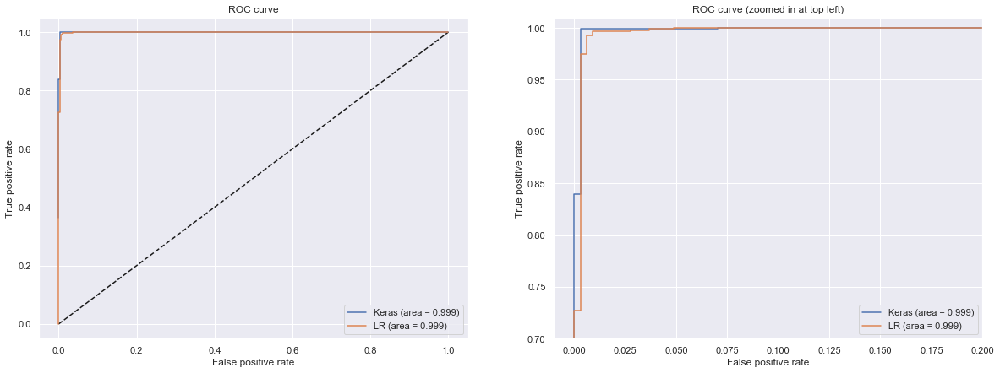

,Prob,CV Accuracy,Accuracy,ROC AUC Score,ROC Area
DNN Regressor,True,0.995914,0.9985,0.999440,0.999440
LogisticRegression,True,0.995164,0.9938,0.992825,0.998977


In [ ]:
y_pred_keras = wtp_dnn_model.predict(X_test_Ss).ravel()
fpr_keras, tpr_keras, thresholds_keras = roc_curve(y_test, y_pred_keras)
auc_keras = auc(fpr_keras, tpr_keras)

y_pred_clf = LR.predict_proba(X_test)[:, 1]
fpr_clf, tpr_clf, thresholds_clf = roc_curve(y_test, y_pred_clf)
auc_clf = auc(fpr_clf, tpr_clf)

fig = plt.figure(figsize=(20, 7))
ax = fig.add_subplot(121)
ax.plot([0, 1], [0, 1], 'k--')
ax.plot(fpr_keras, tpr_keras, label='Keras (area = {:.3f})'.format(auc_keras))
ax.plot(fpr_clf, tpr_clf, label='LR (area = {:.3f})'.format(auc_clf))
ax.set_xlabel('False positive rate')
ax.set_ylabel('True positive rate')
ax.set_title('ROC curve')
ax.legend(loc='best')

# Zoom in view of the upper left corner.
ax2 = fig.add_subplot(122)
ax2.set_xlim(-0.01, 0.2)
ax2.set_ylim(0.7, 1.01)
ax2.plot([0, 1], [0, 1], 'k--')
ax2.plot(fpr_keras, tpr_keras, label='Keras (area = {:.3f})'.format(auc_keras))
ax2.plot(fpr_clf, tpr_clf, label='LR (area = {:.3f})'.format(auc_clf))
ax2.set_xlabel('False positive rate')
ax2.set_ylabel('True positive rate')
ax2.set_title('ROC curve (zoomed in at top left)')
ax2.legend(loc='best')
plt.show()

display(results.sort_values(by='Accuracy', ascending=False))

The plot and the results confirms that DNN is better.

### Wine Quality Classifier Models:


In [ ]:
wqp_class_labels = np.array(wines['quality_label'])
target_names = ['low', 'medium', 'high']

cols = wines.columns
cols = list(cols.drop(['type', 'quality_label', 'quality']))
X_train, X_test, y_train, y_test = train_test_split(wines.loc[:, cols], y_ql.values, test_size=0.20, random_state=101)

#### Decision Tree Classifier



Fitting 5 folds for each of 48 candidates, totalling 240 fits


[Parallel(n_jobs=4)]: Done  76 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 240 out of 240 | elapsed:    6.1s finished


Mean Best Accuracy: 72.26%
------------------------------------------------------------
Best Parameters:
{'clf__class_weight': None, 'clf__criterion': 'entropy', 'clf__max_depth': 9, 'clf__min_samples_leaf': 2, 'clf__splitter': 'best'}
------------------------------------------------------------
Model Performance metrics:
------------------------------
Accuracy:  70.46% 
Precision: 70.12% 
Recall:    70.46% 
F1 Score:  70.25% 

Model Classification report:
------------------------------
              precision    recall  f1-score   support

         low       0.64      0.67      0.65       476
      medium       0.76      0.75      0.76       778
        high       0.28      0.18      0.22        39

    accuracy                           0.70      1293
   macro avg       0.56      0.53      0.54      1293
weighted avg       0.70      0.70      0.70      1293


Prediction Confusion Matrix:
------------------------------
               Predicted:            
                      low me

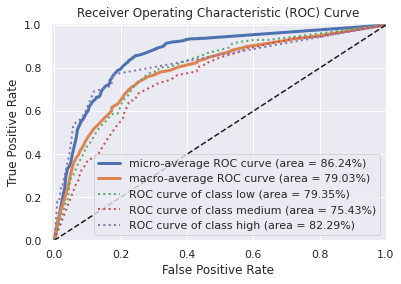

2020-12-20 18:56:52,037 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


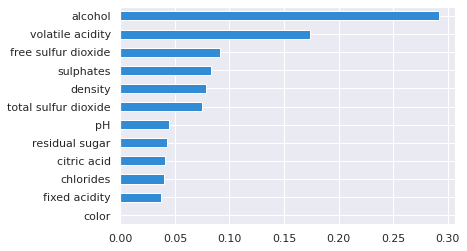

In [ ]:
clf = Pipeline([
        ('clf', DecisionTreeClassifier(random_state=101))])  

# a list of dictionaries to specify the parameters that we'd want to tune
criterion = ['gini', 'entropy']
splitter = ['best']
max_depth = [8, 9, 10, 11] # [15, 20, 25]
min_samples_leaf = [2, 3, 5]
class_weight = ['balanced', None] 

param_grid =\
    [{ 'clf__class_weight': class_weight
      ,'clf__criterion': criterion
      ,'clf__splitter': splitter
      ,'clf__max_depth': max_depth
      ,'clf__min_samples_leaf': min_samples_leaf
}]

gs = GridSearchCV(estimator=clf, param_grid=param_grid, scoring='accuracy', cv=5, verbose=1, n_jobs=4)
DT = Pipeline([
        ('scl', StandardScaler()),
        ('gs', gs)
 ]) 

DT.fit(X_train,y_train)

results = get_results(DT, 'DT First', X_test, y_test, target_names = target_names, reasume=True)

#### Random Forest Classifier


Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:   46.0s
[Parallel(n_jobs=4)]: Done 120 out of 120 | elapsed:  2.5min finished


Mean Best Accuracy: 80.33%
------------------------------------------------------------
Best Parameters:
{'clf__criterion': 'entropy', 'clf__max_depth': None, 'clf__min_samples_split': 3, 'clf__n_estimators': 175}
------------------------------------------------------------
Model Performance metrics:
------------------------------
Accuracy:  82.37% 
Precision: 82.52% 
Recall:    82.37% 
F1 Score:  81.86% 

Model Classification report:
------------------------------
              precision    recall  f1-score   support

         low       0.81      0.75      0.78       476
      medium       0.83      0.89      0.86       778
        high       0.92      0.31      0.46        39

    accuracy                           0.82      1293
   macro avg       0.85      0.65      0.70      1293
weighted avg       0.83      0.82      0.82      1293


Prediction Confusion Matrix:
------------------------------
               Predicted:            
                      low medium high
Actual: low 

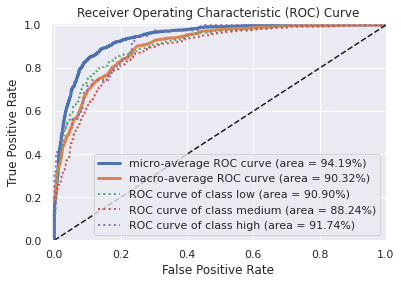

2020-12-20 19:03:33,859 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


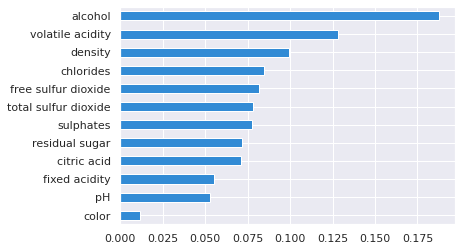

In [ ]:
clf = Pipeline([
        #('pca', PCA(random_state = 101)),
        ('clf', RandomForestClassifier(random_state=101))])  

# a list of dictionaries to specify the parameters that we'd want to tune
SEL = cols
n_components= [len(SEL)-2, len(SEL)-1, len(SEL)] 
whiten = [True, False]
criterion = ['gini', 'entropy']
class_weight = ['balanced', None] 
n_estimators = [155, 175]  
max_depth  = [20, None] #, 3, 4, 5, 10] # 
min_samples_split = [2, 3, 4]
min_samples_leaf = [1] #, 2 , 3]

param_grid =\
    [{ #'clf__class_weight': class_weight
      'clf__criterion': criterion
      ,'clf__n_estimators': n_estimators      
      ,'clf__min_samples_split': min_samples_split
      ,'clf__max_depth': max_depth
      #,'clf__min_samples_leaf': min_samples_leaf
      #,'pca__n_components' : n_components
      #,'pca__whiten' : whiten
}]

gs = GridSearchCV(estimator=clf, param_grid=param_grid, scoring='accuracy', cv=5, verbose=1, n_jobs=4)
RF = Pipeline([
        #('sel', select_fetaures(select_cols=SEL)), 
        ('scl', StandardScaler()),
        ('gs', gs)
 ]) 

RF.fit(X_train,y_train)

results = get_results(RF, 'RF', X_test, y_test, 
                      target_names = target_names, results = results, reasume=False)

In [ ]:
exp = LimeTabularExplainer(X_train.to_numpy(), feature_names=cols, discretize_continuous=True, class_names=target_names)

In [ ]:
print('Corret classified?', ('Yes' if y_test[0]==RF.predict(X_test.iloc[0:1, :])[0] else 'No'))
exp.explain_instance(X_test.iloc[0, :], RF.predict_proba, top_labels=1).show_in_notebook() 

Corret classified? Yes


In [ ]:
print('Corret classified?', ('Yes' if y_test[157]==RF.predict(X_test.iloc[157:158, :])[0] else 'No'))
exp.explain_instance(X_test.iloc[157, :], RF.predict_proba, top_labels=1).show_in_notebook() 

Corret classified? Yes


#### XGBoost (eXtreme Gradient Boosting)


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=4)]: Done   5 out of   5 | elapsed:  1.1min finished


Mean Best Accuracy: 79.05%
------------------------------------------------------------
Best Parameters:
{'clf__booster': 'dart', 'clf__learning_rate': 0.1, 'clf__max_depth': 15, 'clf__n_estimators': 112, 'clf__objective': 'multi:softmax', 'clf__reg_alpha': 0.05, 'clf__reg_lambda': 0.7}
------------------------------------------------------------
Model Performance metrics:
------------------------------
Accuracy:  81.44% 
Precision: 81.51% 
Recall:    81.44% 
F1 Score:  81.07% 

Model Classification report:
------------------------------
              precision    recall  f1-score   support

         low       0.77      0.78      0.78       476
      medium       0.84      0.86      0.85       778
        high       0.86      0.31      0.45        39

    accuracy                           0.81      1293
   macro avg       0.82      0.65      0.69      1293
weighted avg       0.82      0.81      0.81      1293


Prediction Confusion Matrix:
------------------------------
              

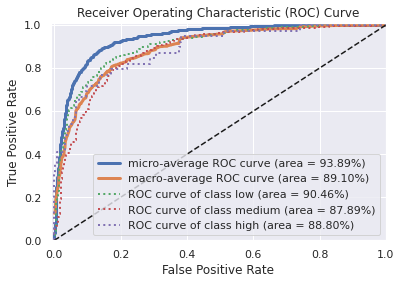

2020-12-20 19:05:49,314 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


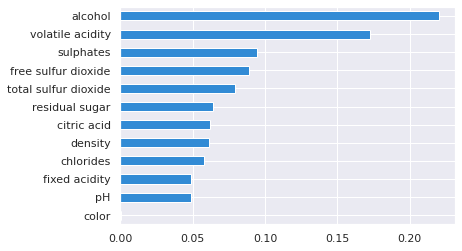

In [ ]:
clf = Pipeline([
        ('clf', xgb.XGBClassifier(base_score=0.5, colsample_bylevel=1, n_jobs=4,
                       colsample_bytree=1, gamma=0.0001, max_delta_step=0, random_state=101, 
                       silent=True, subsample=1))])

SEL = cols_clean
n_est = [112] 
max_depth = [15] #, 14, 16] # [5, 10, 15, 20]
learning_rate = [0.1] #, 0.01]
reg_lambda = [0.7] #, 0.5, 0.6, 0.8] #1e-06, 1e-04, 1e-03, 1e-02, 1e-05, 1e-01, 0.0] 
reg_alpha= [0.05]#, 0.03, 0.06] #, 0.001] # , 0.5, 1, 0.0]
booster = ['dart'] #,'gblinear', 'gbtree'] 
objective = ['multi:softmax'] #, 'multi:softprob']

param_grid =\
    [{ 
      'clf__n_estimators': n_est
      ,'clf__booster': booster
      ,'clf__objective': objective
      ,'clf__learning_rate': learning_rate
      ,'clf__reg_lambda': reg_lambda
      ,'clf__reg_alpha': reg_alpha
      ,'clf__max_depth': max_depth
}]

gs = GridSearchCV(estimator=clf, param_grid=param_grid, scoring='accuracy', cv=5, verbose=1, n_jobs=4)

XGBC = Pipeline([
        #('sel', select_fetaures(select_cols=SEL)), 
        ('scl', StandardScaler()),
        ('gs', gs)
 ]) 

XGBC.fit(X_train,y_train)

results = get_results(XGBC, 'XGBC', X_test, y_test, 
                      target_names = target_names, results = results, reasume=False)

#### KNeighbors Classifier


Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    3.1s
[Parallel(n_jobs=4)]: Done  60 out of  60 | elapsed:    4.3s finished


Mean Best Accuracy: 78.34%
------------------------------------------------------------
Best Parameters:
{'clf__algorithm': 'ball_tree', 'clf__leaf_size': 12, 'clf__n_neighbors': 10, 'clf__p': 1, 'clf__weights': 'distance'}
------------------------------------------------------------
Model Performance metrics:
------------------------------
Accuracy:  80.51% 
Precision: 80.82% 
Recall:    80.51% 
F1 Score:  80.04% 

Model Classification report:
------------------------------
              precision    recall  f1-score   support

         low       0.78      0.74      0.76       476
      medium       0.82      0.87      0.84       778
        high       1.00      0.31      0.47        39

    accuracy                           0.81      1293
   macro avg       0.87      0.64      0.69      1293
weighted avg       0.81      0.81      0.80      1293


Prediction Confusion Matrix:
------------------------------
               Predicted:            
                      low medium high
Ac

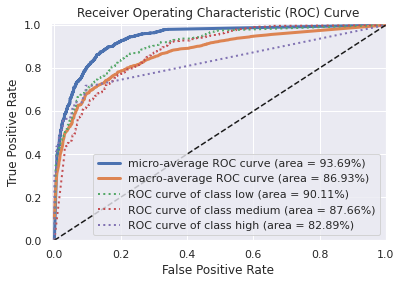

2020-12-20 19:06:11,967 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


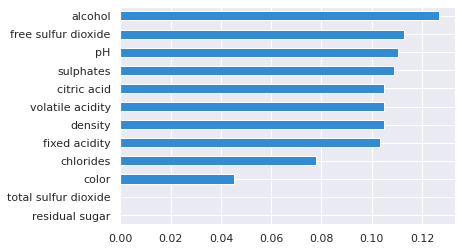

In [ ]:
clf = Pipeline([
        #('pca', PCA(random_state = 101)),
        ('clf', KNeighborsClassifier())])

# a list of dictionaries to specify the parameters that we'd want to tune
SEL = cols_clean
n_components= [len(SEL)-2, len(SEL)-1, len(SEL)] 
whiten = [True, False]

param_grid =\
    [{'clf__n_neighbors': [10, 11, 12, 13] 
     ,'clf__weights': ['distance'] 
     ,'clf__algorithm' : ['ball_tree'] #, 'brute', 'auto',  'kd_tree', 'brute']
     ,'clf__leaf_size': [12, 11, 13]
     ,'clf__p': [1] 
     #,'pca__n_components' : n_components
     #,'pca__whiten' : whiten
     }]

gs = GridSearchCV(estimator=clf, param_grid=param_grid, scoring='accuracy', cv=5, verbose=1, n_jobs=4)

KNNC = Pipeline([
        ('sel', select_fetaures(select_cols=SEL)),
        ('scl', StandardScaler()),
        ('gs', gs)
 ]) 

KNNC.fit(X_train,y_train)

results = get_results(KNNC, 'KNeighborsClassifier', X_test, y_test, 
                      target_names = target_names, results = results, reasume=False)

#### Gradient Boosting for Classification


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=4)]: Done   5 out of   5 | elapsed:  3.2min finished


Mean Best Accuracy: 78.88%
------------------------------------------------------------
Best Parameters:
{'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400}
------------------------------------------------------------
Model Performance metrics:
------------------------------
Accuracy:  81.36% 
Precision: 81.16% 
Recall:    81.36% 
F1 Score:  80.92% 

Model Classification report:
------------------------------
              precision    recall  f1-score   support

         low       0.79      0.75      0.77       476
      medium       0.83      0.88      0.85       778
        high       0.75      0.31      0.44        39

    accuracy                           0.81      1293
   macro avg       0.79      0.65      0.69      1293
weighted avg       0.81      0.81      0.81      1293


Prediction Confusion Matrix:
------------------------------
               Predicted:            
                      low medium high
Actual: low           358    117    1
      

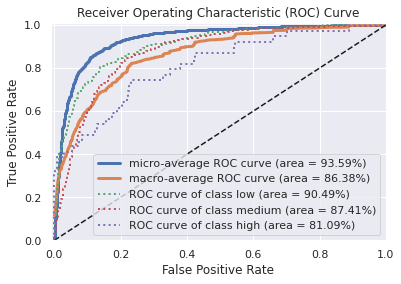

2020-12-20 19:10:38,152 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


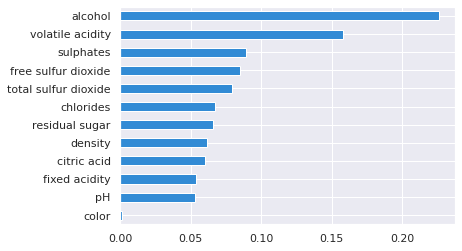

In [ ]:
clf = Pipeline([
        #('pca', PCA(random_state = 101)),
        ('clf', GradientBoostingClassifier(random_state=101))])  

# a list of dictionaries to specify the parameters that we'd want to tune
#cv=None, dual=False,  scoring=None, refit=True,  multi_class='ovr'
SEL = cols_clean
n_components= [len(SEL)-2, len(SEL)-1, len(SEL)] 
whiten = [True, False]
learning_rate =  [1e-02] #, 5e-03, 2e-02]
n_estimators= [400]
max_depth = [10]
n_comp = [2, 3, 4, 5]

param_grid =\
    [{'clf__learning_rate': learning_rate
     ,'clf__max_depth': max_depth
     ,'clf__n_estimators' : n_estimators 
     #,'pca__n_components' : n_components
     #,'pca__whiten' : whiten
}]

gs = GridSearchCV(estimator=clf, param_grid=param_grid, scoring='accuracy', cv=5, verbose=1, n_jobs=4)

GBC = Pipeline([
        #('sel', select_fetaures(select_cols=SEL)),
        ('scl', StandardScaler()),
        ('gs', gs)
 ])  

GBC.fit(X_train,y_train)

results = get_results(GBC, 'GradientBoostingClassifier', X_test, y_test, 
                      target_names = target_names, results = results, reasume=False)

#### AdaBoost classifier


Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=4)]: Done  30 out of  30 | elapsed:  1.3min finished


Mean Best Accuracy: 70.31%
------------------------------------------------------------
Best Parameters:
{'clf__algorithm': 'SAMME.R', 'clf__learning_rate': 0.15, 'clf__n_estimators': 600}
------------------------------------------------------------
Model Performance metrics:
------------------------------
Accuracy:  72.08% 
Precision: 69.85% 
Recall:    72.08% 
F1 Score:  70.74% 

Model Classification report:
------------------------------
              precision    recall  f1-score   support

         low       0.69      0.61      0.65       476
      medium       0.74      0.83      0.78       778
        high       0.00      0.00      0.00        39

    accuracy                           0.72      1293
   macro avg       0.48      0.48      0.48      1293
weighted avg       0.70      0.72      0.71      1293


Prediction Confusion Matrix:
------------------------------
               Predicted:            
                      low medium high
Actual: low           290    185    1

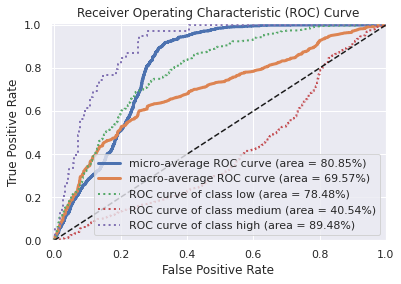

2020-12-20 19:12:16,451 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


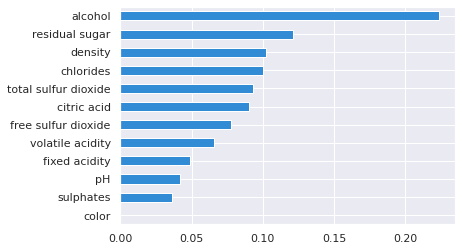

In [ ]:
clf = Pipeline([
        #('pca', PCA(random_state = 101)),
        ('clf', AdaBoostClassifier(random_state=101))])

# a list of dictionaries to specify the parameters that we'd want to tune
SEL = cols_clean
n_components= [len(SEL)-2, len(SEL)-1, len(SEL)] 
whiten = [True, False]
n_comp = [2, 3, 4, 5]

param_grid =\
    [{'clf__learning_rate': [2e-01, 15e-02]
     ,'clf__n_estimators': [500, 600, 700] 
     ,'clf__algorithm' : ['SAMME.R'] # 'SAMME'
     #,'pca__n_components' : n_components
     #,'pca__whiten' : whiten
     #,'lda__n_components': n_comp
     }]

gs = GridSearchCV(estimator=clf, param_grid=param_grid, scoring='accuracy', cv=5, verbose=1, n_jobs=4)

ADAB = Pipeline([
        #('sel', select_fetaures(select_cols=SEL)),
        ('scl', StandardScaler()),
        #('lda', LDA(store_covariance=True)),
        ('gs', gs)
 ])  

ADAB.fit(X_train,y_train)

results = get_results(ADAB, 'AdaBoostClassifier', X_test, y_test, 
                      target_names = target_names, results = results, reasume=False)

#### Logistic Regression



Fitting 5 folds for each of 1463 candidates, totalling 7315 fits


[Parallel(n_jobs=4)]: Done 348 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 1182 tasks      | elapsed:   29.9s
[Parallel(n_jobs=4)]: Done 1789 tasks      | elapsed:   48.4s
[Parallel(n_jobs=4)]: Done 3189 tasks      | elapsed:  1.2min
[Parallel(n_jobs=4)]: Done 4989 tasks      | elapsed:  1.7min
[Parallel(n_jobs=4)]: Done 7189 tasks      | elapsed:  2.4min
[Parallel(n_jobs=4)]: Done 7315 out of 7315 | elapsed:  2.4min finished


Mean Best Accuracy: 70.60%
------------------------------------------------------------
Best Parameters:
{'clf__C': 1.0, 'clf__class_weight': 'balanced', 'clf__penalty': 'l2', 'clf__solver': 'liblinear', 'clf__tol': 0.01}
------------------------------------------------------------
Model Performance metrics:
------------------------------
Accuracy:  71.85% 
Precision: 70.04% 
Recall:    71.85% 
F1 Score:  70.87% 

Model Classification report:
------------------------------
              precision    recall  f1-score   support

         low       0.64      0.71      0.68       476
      medium       0.77      0.76      0.76       778
        high       0.00      0.00      0.00        39

    accuracy                           0.72      1293
   macro avg       0.47      0.49      0.48      1293
weighted avg       0.70      0.72      0.71      1293


Prediction Confusion Matrix:
------------------------------
               Predicted:            
                      low medium high
Actu

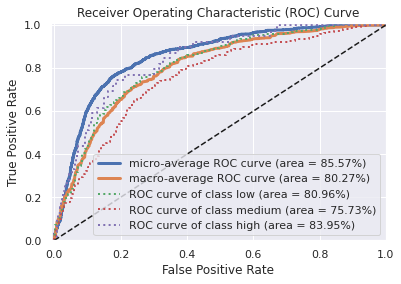

2020-12-20 19:15:14,214 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


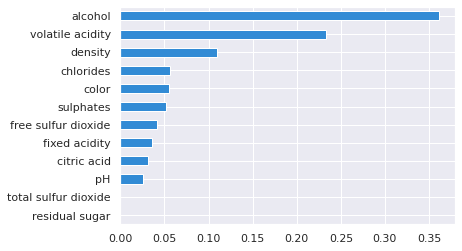

In [ ]:
clf = Pipeline([
        #('pca', PCA(random_state = 101)),
        ('clf', LogisticRegression(random_state=101))])  

# a list of dictionaries to specify the parameters that we'd want to tune
SEL = cols_clean
n_components= [len(SEL)-2, len(SEL)-1, len(SEL)] 
whiten = [True, False]
C =  [1e-06, 5e-07, 1e-05, 1e-04, 1e-03, 1e-02, 1e-01, 1.0, 10.0, 100.0, 1000.0]
tol = [1e-06, 5e-07, 1e-05, 1e-04, 1e-03, 1e-02, 1e-01]

param_grid =\
    [{'clf__C': C
     ,'clf__solver': ['liblinear', 'saga'] 
     ,'clf__penalty': ['l1', 'l2']
     ,'clf__tol' : tol 
     ,'clf__class_weight': ['balanced']
     #,'pca__n_components' : n_components
     #,'pca__whiten' : whiten
},
    {'clf__C': C
     ,'clf__max_iter': [3, 9, 2, 7, 4]
     ,'clf__solver': ['newton-cg', 'sag', 'lbfgs']
     ,'clf__penalty': ['l2']
     ,'clf__tol' : tol 
     ,'clf__class_weight': ['balanced'] 
     #,'pca__n_components' : n_components
     #,'pca__whiten' : whiten
}]

gs = GridSearchCV(estimator=clf, param_grid=param_grid, scoring='accuracy', cv=5, verbose=1, n_jobs=4)

LR = Pipeline([
        ('sel', select_fetaures(select_cols=SEL)),
        ('scl', StandardScaler()),
        ('gs', gs)
 ])  

LR.fit(X_train,y_train)

results = get_results(LR, 'LogisticRegression', X_test, y_test, 
                      target_names = target_names, results = results, reasume=False)

#### Linear Support Vector Classification



Fitting 5 folds for each of 27 candidates, totalling 135 fits


[Parallel(n_jobs=4)]: Done  76 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 128 out of 135 | elapsed:    3.7s remaining:    0.2s
[Parallel(n_jobs=4)]: Done 135 out of 135 | elapsed:    3.8s finished


Mean Best Accuracy: 70.50%
------------------------------------------------------------
Best Parameters:
{'clf__C': 0.06, 'clf__dual': True, 'clf__loss': 'hinge', 'clf__max_iter': 15, 'clf__penalty': 'l2', 'clf__tol': 1e-06}
------------------------------------------------------------
Model Performance metrics:
------------------------------
Accuracy:  71.77% 
Precision: 70.05% 
Recall:    71.77% 
F1 Score:  70.83% 

Model Classification report:
------------------------------
              precision    recall  f1-score   support

         low       0.64      0.71      0.68       476
      medium       0.77      0.76      0.76       778
        high       0.00      0.00      0.00        39

    accuracy                           0.72      1293
   macro avg       0.47      0.49      0.48      1293
weighted avg       0.70      0.72      0.71      1293


Prediction Confusion Matrix:
------------------------------
               Predicted:            
                      low medium high
A

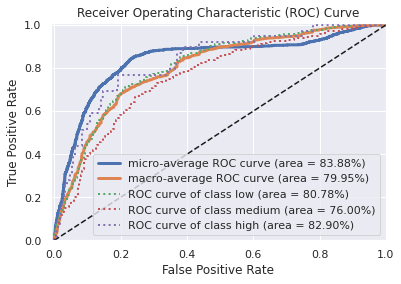

2020-12-20 19:15:25,791 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


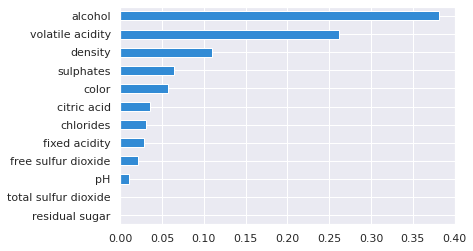

In [ ]:
clf = Pipeline([
        ('pca', PCA(random_state = 101)),
        ('clf', LinearSVC(random_state=101, multi_class='ovr', class_weight='balanced'))])

# a list of dictionaries to specify the parameters that we'd want to tune
SEL = cols_clean
n_components= [len(SEL)-2, len(SEL)-1, len(SEL)] 
whiten = [True, False]
C =  [0.06, 0.08, 0.07] #, 1.0, 10.0, 100.0, 1000.0]
tol = [1e-06]
max_iter = [10, 15, 9]

param_grid =\
    [{'clf__loss': ['hinge']
     ,'clf__tol': tol
     ,'clf__C': C
     ,'clf__penalty': ['l2']
     ,'clf__max_iter' : max_iter
     ,'clf__dual' : [True]
     #,'pca__n_components' : n_components
     #,'pca__whiten' : whiten
     }
    ,{'clf__loss': ['squared_hinge']
     ,'clf__tol': tol
     ,'clf__C': C
     ,'clf__penalty': ['l2', 'l1']
     ,'clf__max_iter' : max_iter
     ,'clf__dual' : [False]
     #,'pca__n_components' : n_components
     #,'pca__whiten' : whiten
     }]

gs = GridSearchCV(estimator=clf, param_grid=param_grid, scoring='accuracy', cv=5, verbose=1, n_jobs=4)

LSVC = Pipeline([
        ('sel', select_fetaures(select_cols=SEL)),
        ('scl', StandardScaler()),
        #('lda', LDA(n_components = 2, store_covariance=True)),
        ('gs', gs)
 ])  

LSVC.fit(X_train,y_train)

results = get_results(LSVC, 'LinearSVC', X_test, y_test, 
                      target_names = target_names, results = results, reasume=False)

### Check the best results from the models hyper parametrization

In [ ]:
results.sort_values(by='Accuracy', ascending=False)

,Prob,CV Accuracy,Accuracy,ROC AUC Score,ROC Area
RF,True,0.803288,0.8237,0.808663,0.903238
XGBC,True,0.790522,0.8144,0.807273,0.891020
GradientBoostingClassifier,True,0.788781,0.8136,0.802055,0.863788
KNeighborsClassifier,True,0.783366,0.8051,0.791251,0.869256
AdaBoostClassifier,True,0.703095,0.7208,0.699512,0.695680
LogisticRegression,True,0.705996,0.7185,0.714436,0.802733
LinearSVC,False,0.705029,0.7177,0.714428,0.799529
DT First,True,0.722631,0.7046,0.703629,0.790266


We will try a staked model with RF, GBC and XGB, for meta-classier we can use RF or GBC. 

### Make Staked Classifier


Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:   45.8s
[Parallel(n_jobs=4)]: Done 120 out of 120 | elapsed:  2.6min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=4)]: Done   5 out of   5 | elapsed:  3.1min finished


Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:   11.1s
[Parallel(n_jobs=4)]: Done 120 out of 120 | elapsed:   31.5s finished


Mean Best Accuracy: 70.50%
------------------------------------------------------------
Best Parameters:
{'clf__C': 0.06, 'clf__dual': True, 'clf__loss': 'hinge', 'clf__max_iter': 15, 'clf__penalty': 'l2', 'clf__tol': 1e-06}
------------------------------------------------------------
Model Performance metrics:
------------------------------
Accuracy:  81.36% 
Precision: 81.16% 
Recall:    81.36% 
F1 Score:  80.92% 

Model Classification report:
------------------------------
              precision    recall  f1-score   support

         low       0.79      0.75      0.77       476
      medium       0.83      0.88      0.85       778
        high       0.75      0.31      0.44        39

    accuracy                           0.81      1293
   macro avg       0.79      0.65      0.69      1293
weighted avg       0.81      0.81      0.81      1293


Prediction Confusion Matrix:
------------------------------
               Predicted:            
                      low medium high
A

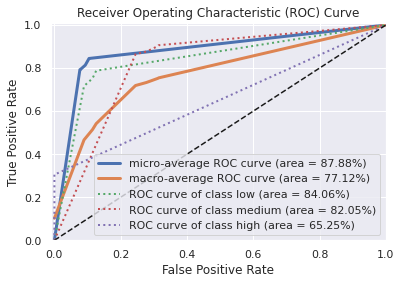

2020-12-20 19:23:19,632 - skater.core.explanations - WARNING - Multiprocessing failed, going single process


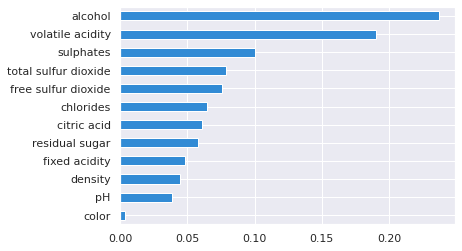

In [ ]:
sclf = StackingClassifier(classifiers=[RF, GBC], #XGBC is taking too long
                          use_probas=False,
                          average_probas=False,
                          use_features_in_secondary=False,
                          meta_classifier= RF)

sclf.fit(X=X_train,y=y_train)

results = get_results(sclf, 'StackingClassifier', X_test, y_test, 
                      target_names = target_names, results = results, reasume=False)